In [1]:
#import PyHeston # The PyHeston package must be installed.
import numpy
import itertools

#from BlackScholes import *
from random import Random
from numpy import *
from scipy import *
from time import *
from datetime import *
import numpy as np
import sys
import csv
import math

from sklearn import gaussian_process
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel, RBF
from numpy.core.umath_tests import matrix_multiply

import matplotlib.pyplot as plt
plt.style.use('ggplot')
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import scipy as sp


from random import Random
from numpy import *
from time import *
from datetime import *
#from BlackScholes import *
import math
import scipy as sp

import matplotlib.pyplot as plt
from sklearn import gaussian_process
from sklearn.gaussian_process.kernels import Matern, WhiteKernel, ConstantKernel, RBF

%matplotlib inline
%load_ext autoreload
%autoreload 2

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.


# Load modules and external files

You need to import four python scripts for implied volatility calibration :
- *newton.py*
- *BSImplVol.py*
- *BS.py*
- *Bisect.py*

In [2]:
import pandas as pd
import numpy as np
import scipy.integrate as integrate
from scipy import interpolate
import math
import matplotlib.pyplot as plt

import tensorflow as tf
from io import StringIO

plt.style.use('ggplot')
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
import sklearn as skl
from sklearn import preprocessing
import importlib
import scipy.stats as st
import numpy as np
import math
import scipy.stats as st
import matplotlib.ticker as mtick
import time
from scipy import interpolate

In [3]:
%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [385]:
#Load python files to google colaborative environment
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

ModuleNotFoundError: No module named 'google.colab'

In [4]:
from BS import bsformula
from Bisect import bisect
from newton import newton
from BSImplVol import bsimpvol

# Load data with google colab 

#### From excel file :

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [15]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [5]:
#Read csv files as dataFrames
zeroCouponCurve = pd.read_csv("discount.csv",decimal=".").apply(pd.to_numeric)
dividendCurve = pd.read_csv("dividend.csv",decimal=".").apply(pd.to_numeric)
trainingData = pd.read_csv("dataTrain.csv",decimal=".").apply(pd.to_numeric)
testingData = pd.read_csv("dataTest.csv",decimal=".").apply(pd.to_numeric)
underlyingNative = pd.read_csv("underlying.csv",decimal=".").apply(pd.to_numeric)
localVolatilityNative = pd.read_csv("locvol.csv",decimal=".").apply(pd.to_numeric)


In [6]:
def parseDatFile(fileName):
  s = open(fileName).read()
  
  defPos=s.find("[option]")
  finPos=s.find("[dividend]")
  df = pd.read_csv(StringIO(s[defPos:finPos].replace("\n\n",";").replace("\n",",").replace(";",";\n")),decimal=".", sep=",", header=None)
  
  matC = pd.to_numeric(df[1].str.split(pat="= ", expand=True)[1]).round(3)
  strikeC = pd.to_numeric(df[3].str.split(pat="= ", expand=True)[1]).round()
  priceC = pd.to_numeric(df[4].str.replace(";","").str.split(pat="= ", expand=True)[1])
  typeC = pd.to_numeric(df[2].str.split(pat="= ", expand=True)[1])
  formattedDat = pd.DataFrame([matC, strikeC, priceC, typeC], index = ["Maturity", "Strike", "Price", "Type"]).transpose().astype({"Type":"int32"})
  
  filteredDat = formattedDat[formattedDat["Type"]==2]
  return filteredDat
filteredDat = parseDatFile("9_8_2001__filterdax.dat")

#### From Dat files

In [74]:
def parseModelParamDatFile(fileName):
    s = open(fileName).read()
    
    parts = s.split("\n\n")
    number1 = parts[0]
    repo = parts[1]
    dates = parts[2]
    interestRates = parts[3]
    dividendRates = parts[4]
    
    number2 = parts[5]
    number3 = parts[6]
    
    n = parts[7]
    sigmaRef = parts[8]
    h = parts[9]
    sigmaMax = parts[10]
    sigmaMin = parts[11]
    
    number4 = parts[12]
    underlying = parts[13]
    
    def splitRow(row):
        return np.array(row.split("\t")).astype(np.float)
    
    tree = ("\n".join(parts[14:])).split("\n")
    tree.remove("")
    formattedTree = np.reshape(np.array(list(map(splitRow, tree))), (-1,3))
    
    
    return pd.DataFrame(formattedTree, columns = ["date", "stock(%)", "vol"])
    

In [75]:
def parseImpliedVolDatFile(fileName):
    s = open(fileName).read()
    
    parts = s.split("\n\n")
    
    def splitRow(row):
        return np.array(row.split("\t")).astype(np.float)
    
    testGrid = ("\n".join(parts)).split("\n")
    testGrid.remove("")
    formattedTestGrid = np.reshape(np.array(list(map(splitRow, testGrid))), (-1,4))
    
    return pd.DataFrame(formattedTestGrid, columns=["Strike","Maturity","Implied vol.","Option price"])

In [76]:
def parseCalibrOutDatFile(fileName):
    s = open(fileName).read()
    
    parts = s.split("\n")
    
    def splitRow(row):
        return np.array(row.split("\t"))
    def filterRow(row):
        return len(row)==10
    def formatRow(row):
        return row.astype(np.float)
    
    #tree = ("\n".join(parts)).split("\n")
    #tree.remove("")
    filteredTrainingData = list(filter(filterRow , 
                                       list(map(splitRow, parts))))
    formattedTrainingData = np.array(list(map(formatRow, filteredTrainingData)))
    
    colNames = ["Active", "Option\ntype", "Maturity", "Strike", "Moneyness", 
                "Option\nprice", "Implied\nvol.", "Calibrated\nvol.","Market vol. -\nCalibrated vol."]
    dfTrainingData = pd.DataFrame(formattedTrainingData[:,:-1], columns = colNames)
    dfTrainingData["Active"] = dfTrainingData["Active"].astype(np.int) 
    dfTrainingData["Option\ntype"] = dfTrainingData["Option\ntype"].astype(np.int) 
    return dfTrainingData

In [77]:
def parseDatFiles(fileName):
    s = open(fileName).read()
    
    posUnderlying = s.find("[underlying]")
    posZeroCoupon = s.find("[zero_coupon]")
    posOption = s.find("[option]")
    posDividend = s.find("[dividend]")
    
    underlyingString = s[posUnderlying:posZeroCoupon]
    zeroCouponString = s[posZeroCoupon:posOption]
    optionString = s[posOption:posDividend]
    dividendString = s[posDividend:-2] 
    
    def extractData(subStr, tag):
        parts = subStr.replace(tag + "\n", "").split("\n\n")
        try :
            parts.remove("")
        except ValueError:
            #Not found, we continue
            pass
        
        def parseRow(row):
            return (int(row.split(" = ")[1]) if (row.split(" = ")[0] == "type") else float(row.split(" = ")[1]))
        
        def splitRow(row):
            table = np.array(row.split("\n"))
            parseTable = np.array(list(map(parseRow, table)))
            return np.reshape(parseTable, (-1))
        
        return np.array(list(map(splitRow, parts)))
    
    
    underlying = pd.DataFrame(extractData(underlyingString, "[underlying]"), 
                              columns=["S","Repo"])
    zeroCoupon = pd.DataFrame(extractData(zeroCouponString, "[zero_coupon] "), 
                              columns=["Maturity","Price"])
    option = pd.DataFrame(extractData(optionString, "[option] "), 
                          columns=["Maturity","Type", "Price", "Strike"])
    option["Type"] = option["Type"].astype(np.int) 
    dividend = pd.DataFrame(extractData(dividendString, "[dividend] "), 
                            columns=["Maturity","Amount"])
    return underlying, zeroCoupon, dividend, option

In [78]:
localVolatilityNative = parseModelParamDatFile("./esx/8_8_2001__filterdax.dat.modelparam.dat")
#localVolatilityNative = parseModelParamDatFile("./esx/30_11_1999__filteresx.dat.modelparam.dat")

In [79]:
testingData = parseImpliedVolDatFile("./esx/8_8_2001__filterdax.dat.impliedvol.dat")
#testingData = parseImpliedVolDatFile("./esx/30_11_1999__filteresx.dat.impliedvol.dat")

In [80]:
trainingData = parseCalibrOutDatFile("./esx/8_8_2001__filterdax.dat.calibr.out.dat")
#trainingData = parseCalibrOutDatFile("./esx/30_11_1999__filteresx.dat.calibr.out.dat")

In [81]:
underlyingNative, zeroCouponCurve, dividendCurve, filteredDat = parseDatFiles("./esx/8_8_2001__filterdax.dat")
#underlyingNative, zeroCouponCurve, dividendCurve, filteredDat = parseDatFiles("./esx/30_11_1999__filteresx.dat")

#### Cleaning datasets

In [7]:
#Format dividend curve as a Pandas series
dividendDf = dividendCurve.set_index('Maturity').sort_index()
dividendDf.loc[1.0] = 0.0
dividendDf.sort_index(inplace=True)
dividendDf.tail()

,Amount
Maturity,
0.197260,0.004393
0.369977,1.040286
0.600114,2.100796
0.868493,-1.828913
1.000000,0.000000


In [8]:
#Format zero coupon curve as a Pandas series
rateCurveDf = zeroCouponCurve.set_index('Maturity').sort_index()
# keep only rates expriring before 1 year
rateCurveDf = rateCurveDf.loc[rateCurveDf.index <= 1.01]
rateCurveDf.head()

,Price
Maturity,
0.083333,0.996229
0.166667,0.992528
0.250000,0.988960
0.333333,0.985523
0.416667,0.982071


In [9]:
localVolatilityNative.head()

,date,stock(%),vol
0,0.0000,1.000000,0.280101
1,NaN,NaN,NaN
2,0.0075,0.939194,0.263200
3,0.0075,1.000639,0.266474
4,0.0075,1.066103,0.200681


In [10]:
#Format local volatility
localVolatility = localVolatilityNative.dropna()
localVolatility["Strike"] = localVolatility["stock(%)"] * underlyingNative["S"].values
localVolatility["date"] = localVolatility["date"].round(decimals=3)
renameDict = {"date": "Maturity", 
              "vol" : "LocalVolatility", 
              "stock(%)" : "StrikePercentage"}
localVolatility = localVolatility.rename(columns=renameDict).set_index(["Strike", "Maturity"])
localVolatility.head()

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,,StrikePercentage,LocalVolatility
Strike,Maturity,,
5614.510000,0.000,1.000000,0.280101
5273.114105,0.008,0.939194,0.263200
5618.097672,0.008,1.000639,0.266474
5985.645955,0.008,1.066103,0.200681
4952.480668,0.015,0.882086,0.234397


In [11]:
localVolatility.head()

,,StrikePercentage,LocalVolatility
Strike,Maturity,,
5614.510000,0.000,1.000000,0.280101
5273.114105,0.008,0.939194,0.263200
5618.097672,0.008,1.000639,0.266474
5985.645955,0.008,1.066103,0.200681
4952.480668,0.015,0.882086,0.234397


In [12]:
underlyingNative.head()

,S,Repo
0,5614.51,0


In [13]:
testingData.head()

,Strike,Maturity,Implied vol.,Option price,Implied delta,Implied gamma,Implied theta,Local delta,Local gamma
0,4107.46,0.2,0.275000,1550.680,0.997474,0.000016,27.3039,0.996246,0.000016
1,4284.76,0.2,0.284375,1377.150,0.989429,0.000043,76.6171,0.985826,0.000050
2,4462.06,0.2,0.284375,1205.610,0.975439,0.000084,150.0630,0.967824,0.000102
3,4639.36,0.2,0.279687,1037.280,0.953411,0.000141,249.4430,0.937836,0.000184
4,4816.66,0.2,0.277734,875.274,0.916765,0.000222,388.5610,0.889867,0.000291


In [14]:
#Treatment for training data
filteredTestingData = testingData[(testingData["Implied vol."] > 0) * (testingData["Option price"] > 0)]
filteredTestingData["Maturity"] = filteredTestingData["Maturity"].round(decimals=3)
renameDict = {"Implied vol.": "ImpliedVol", 
              "Option price" : "Price", 
              "Implied delta" : "ImpliedDelta", 
              "Implied gamma" : "ImpliedGamma",
              "Implied theta" : "ImpliedTheta",
              "Local delta" : "LocalDelta",
              "Local gamma" : "LocalGamma"}
formattedTestingData = filteredTestingData.rename(columns=renameDict).set_index(["Strike", "Maturity"])["ImpliedVol"]
formattedTestingData.head()

/home/chataigner/anaconda3/lib/python3.7/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))


Strike   Maturity
4107.46  0.2         0.275000
4284.76  0.2         0.284375
4462.06  0.2         0.284375
4639.36  0.2         0.279687
4816.66  0.2         0.277734
Name: ImpliedVol, dtype: float64

In [15]:
trainingData.head()

,Active,Option type,Maturity,Strike,Moneyness,Option price,Implied vol.,Calibrated vol.,Market vol. - Calibrated vol.
0,1,1,0.121,3800,0.677,1841.372,0.425,-1.0,1.425
1,1,2,0.121,3800,0.677,0.003,0.397,0.3,0.097
2,1,1,0.121,3900,0.695,1741.925,0.406,-1.0,1.406
3,1,2,0.121,3900,0.695,0.013,0.388,0.3,0.087
4,1,1,0.121,4000,0.712,1642.492,0.388,-1.0,1.388


In [16]:
#Treatment for testing data
filteredTrainingData = trainingData[(trainingData["Calibrated\nvol."] > 0) * (trainingData["Option\nprice"] > 0) * (trainingData["Option\ntype"] == 2)]
filteredTrainingData["Maturity"] = filteredTrainingData["Maturity"].round(decimals=3)
renameDict = {"Option\ntype" : "OptionType", 
              "Option\nprice" : "Price", 
              "Calibrated\nvol." : "ImpliedVol",#"LocalImpliedVol", 
              "Implied\nvol." : "LocalImpliedVol"}#"ImpliedVol"}
formattedTrainingData = filteredTrainingData.drop(["Active", "Market vol. -\nCalibrated vol."],axis=1).rename(columns=renameDict).set_index(["Strike","Maturity"])
formattedTrainingData.head()

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,,OptionType,Moneyness,Price,LocalImpliedVol,ImpliedVol
Strike,Maturity,,,,,
3800,0.121,2,0.677,0.003,0.397,0.30
3900,0.121,2,0.695,0.013,0.388,0.30
4000,0.121,2,0.712,0.038,0.375,0.30
4100,0.121,2,0.730,0.063,0.369,0.25
4200,0.121,2,0.748,0.299,0.356,0.30


In [17]:
formattedTrainingData.shape

(192, 5)

In [18]:
[1,2,3,4,5,6,7][4:]

[5, 6, 7]

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

In [19]:
#Compute the integral and return the linear interpolation function 
def interpIntegral(curve):
    #curve is piece-wise constant
    timeDelta = curve.index.to_series().diff().fillna(0)
    timeStep = np.linspace(0,0.99,100)
    integralStepWise = (curve * timeDelta).cumsum()
    integralStepWise.loc[0] = 0.0
    integralStepWise.sort_index(inplace=True)
    integralSpline = interpolate.interp1d(integralStepWise.index,
                                          integralStepWise, 
                                          fill_value= 'extrapolate', 
                                          kind ='linear')
    return pd.Series(integralSpline(timeStep),index=timeStep), integralSpline

def bootstrapZeroCoupon(curvePrice, name):
    #Bootstrap short rate curve
    def computeShortRate(curve) :
      shortRateList = [] 
      for i in range(curve.size):
        if i == 0 :
          shortRateList.append(-(np.log(curve.iloc[i]))/(curve.index[i]))
        else : 
          shortRateList.append(-(np.log(curve.iloc[i])-np.log(curve.iloc[i-1]))/(curve.index[i]-curve.index[i-1]))
      return pd.Series(shortRateList,index = curve.index)
    #For t=0 we take the first available point to ensure right continuity
    riskFreeCurve = computeShortRate(curvePrice)
    riskFreeCurve.loc[0.00] = riskFreeCurve.iloc[0]
    riskFreeCurve = riskFreeCurve.sort_index()

    #Bootstrap yield curve
    def zeroYield(x):
      if(float(x.name) < 1):
        return (1/x - 1)/float(x.name)
      else:
        return (x**(-1/float(x.name)) - 1)
    yieldCurve = curvePrice.apply(zeroYield, axis = 1)
    yieldCurve.loc[0.00] = yieldCurve.iloc[0]
    yieldCurve = yieldCurve.sort_index()

    plt.plot(riskFreeCurve, label = "Short rate")

    #Interpolate short rate curve and yield curve
    timeStep = np.linspace(0,0.99,100)
    riskCurvespline = interpolate.interp1d(riskFreeCurve.index,
                                           riskFreeCurve,#riskFreeCurve[name],
                                           fill_value= 'extrapolate',
                                           kind ='next')
    interpolatedCurve = pd.Series(riskCurvespline(timeStep),index=timeStep)
    plt.plot(interpolatedCurve, label="Interpolated short rate")
    plt.legend()
    plt.show()

    plt.plot(yieldCurve, label = "Yield curve")
    yieldCurvespline = interpolate.interp1d(yieldCurve.index,
                                            yieldCurve['Price'],
                                            fill_value= 'extrapolate',
                                            kind ='next')
    interpolatedCurve = pd.Series(yieldCurvespline(timeStep),index=timeStep)
    plt.plot(interpolatedCurve, label = "Interpolated Yield curve")
    plt.legend()
    plt.show()
    
    #Integrate short rate
    interpolatedIntegral, riskFreeIntegral = interpIntegral(riskFreeCurve)
    plt.plot(interpolatedIntegral)
    plt.show()

    return riskFreeCurve, riskCurvespline, yieldCurve, yieldCurvespline, interpolatedIntegral, riskFreeIntegral


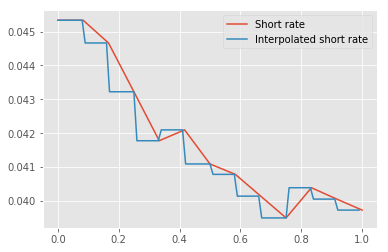

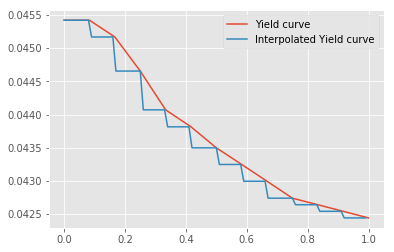

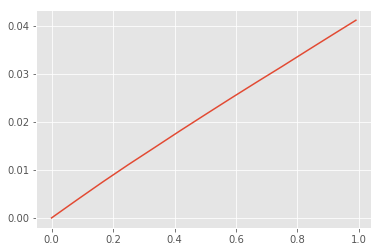

In [20]:
riskFreeCurve, riskCurvespline, yieldCurve, yieldCurvespline, interpolatedIntegral, riskFreeIntegral = bootstrapZeroCoupon(rateCurveDf, "Short rate")

In [21]:
riskFreeCurve

Maturity
0.000000    Price    0.045335
Name: 0.08333333333330001, d...
0.083333    Price    0.045335
Name: 0.08333333333330001, d...
0.166667                     Price    0.044664
dtype: float64
0.250000                     Price    0.043223
dtype: float64
0.333333                     Price    0.041778
dtype: float64
0.416667                     Price    0.042098
dtype: float64
0.500000                     Price    0.041092
dtype: float64
0.583333                     Price    0.040785
dtype: float64
0.666667                     Price    0.040142
dtype: float64
0.750000                     Price    0.039499
dtype: float64
0.833333                     Price    0.040391
dtype: float64
0.916667                     Price    0.040055
dtype: float64
1.000000                      Price    0.03973
dtype: float64
dtype: object

In [22]:
interpolatedIntegral

0.00    0.000000
0.01    0.000453
0.02    0.000907
0.03    0.001360
0.04    0.001813
0.05    0.002267
0.06    0.002720
0.07    0.003173
0.08    0.003627
0.09    0.004076
0.10    0.004522
0.11    0.004969
0.12    0.005416
0.13    0.005862
0.14    0.006309
0.15    0.006755
0.16    0.007202
0.17    0.007644
0.18    0.008076
0.19    0.008508
0.20    0.008941
0.21    0.009373
0.22    0.009805
0.23    0.010237
0.24    0.010670
0.25    0.011102
0.26    0.011520
0.27    0.011937
0.28    0.012355
0.29    0.012773
          ...   
0.70    0.029576
0.71    0.029971
0.72    0.030366
0.73    0.030761
0.74    0.031156
0.75    0.031551
0.76    0.031955
0.77    0.032359
0.78    0.032763
0.79    0.033167
0.80    0.033571
0.81    0.033975
0.82    0.034379
0.83    0.034783
0.84    0.035184
0.85    0.035585
0.86    0.035985
0.87    0.036386
0.88    0.036787
0.89    0.037187
0.90    0.037588
0.91    0.037988
0.92    0.038388
0.93    0.038785
0.94    0.039182
0.95    0.039580
0.96    0.039977
0.97    0.0403

### Boostraping dividend curve

In [23]:
def bootstrapDividend(curvePrice, underlying, name):
    #Compute cumulative sum of dividend plus spot price
    priceEvolution = underlying['S'].iloc[0] - curvePrice['Amount'].cumsum()
    priceEvolution.loc[0] = underlying['S'].iloc[0]
    priceEvolution.sort_index(inplace=True)

    #Bootstrap short rate for dividend
    def computeShortRate(curve) :
      shortRateList = [] 
      for i in range(curve.size):
        if i == 0 :
          shortRateList.append(-(np.log(curve.iloc[i+1])-np.log(curve.iloc[i]))/(curve.index[i+1]-curve.index[i]))
        else : 
          shortRateList.append(-(np.log(curve.iloc[i])-np.log(curve.iloc[i-1]))/(curve.index[i]-curve.index[i-1]))
      return pd.Series(shortRateList,index = curve.index).dropna()
    logReturnDividendDf = computeShortRate(priceEvolution)

    #Dividend yield curve
    def divYield(x):
      return ((priceEvolution[x]/priceEvolution.iloc[0])**(1/float(x)) - 1) #np.log(priceEvolution[x]/priceEvolution.iloc[0])/x
    dividendYield = logReturnDividendDf.index.to_series().tail(-1).apply(divYield)
    dividendYield.loc[0.00] = dividendYield.iloc[0]
    dividendYield = dividendYield.sort_index()

    plt.plot(logReturnDividendDf, label = "Short rate")

    #Interpolate short rate curve and yield curve
    timeStep = np.linspace(0,0.99,100)
    logReturnDividendSpline = interpolate.interp1d(logReturnDividendDf.index,
                                                   logReturnDividendDf,#logReturnDividendDf[name],
                                                   fill_value= 'extrapolate',
                                                   kind ='next')
    interpolatedCurve = pd.Series(logReturnDividendSpline(timeStep),index=timeStep)
    plt.plot(interpolatedCurve, label="Interpolated short rate")
    plt.legend()
    plt.show()

    plt.plot(dividendYield, label = "Yield curve")
    yieldCurvespline = interpolate.interp1d(dividendYield.index,
                                            dividendYield.values,
                                            fill_value= 'extrapolate',
                                            kind ='next')
    interpolatedCurve = pd.Series(yieldCurvespline(timeStep),index=timeStep)
    plt.plot(interpolatedCurve, label = "Interpolated Yield curve")
    plt.legend()
    plt.show()
    
    #Integrate short rate
    interpolatedIntegral, logReturnDividendIntegral = interpIntegral(logReturnDividendDf)#logReturnDividendDf[name])
    plt.plot(interpolatedIntegral)
    plt.show()

    return logReturnDividendDf, logReturnDividendSpline, dividendYield, yieldCurvespline, interpolatedIntegral, logReturnDividendIntegral

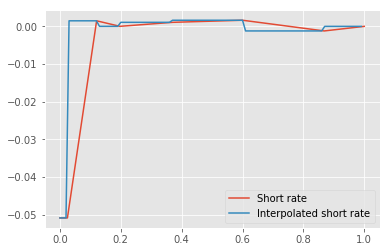

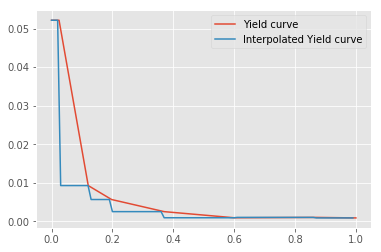

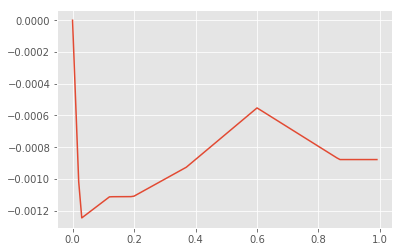

In [24]:
spreadDividend, divSpline, yieldDividend, divYieldSpline, interpolatedIntegral, divSpreadIntegral  = bootstrapDividend(dividendDf, underlyingNative, "Spread")

In [25]:
spreadDividend

Maturity
0.000000   -0.050841
0.024658   -0.050841
0.120548    0.001474
0.197260    0.000010
0.369977    0.001072
0.600114    0.001625
0.868493   -0.001213
1.000000   -0.000000
dtype: float64

In [26]:
interpolatedIntegral

0.00    0.000000
0.01   -0.000508
0.02   -0.001017
0.03   -0.001246
0.04   -0.001231
0.05   -0.001216
0.06   -0.001202
0.07   -0.001187
0.08   -0.001172
0.09   -0.001157
0.10   -0.001143
0.11   -0.001128
0.12   -0.001113
0.13   -0.001112
0.14   -0.001112
0.15   -0.001112
0.16   -0.001112
0.17   -0.001112
0.18   -0.001112
0.19   -0.001112
0.20   -0.001109
0.21   -0.001098
0.22   -0.001087
0.23   -0.001076
0.24   -0.001066
0.25   -0.001055
0.26   -0.001044
0.27   -0.001034
0.28   -0.001023
0.29   -0.001012
          ...   
0.70   -0.000674
0.71   -0.000686
0.72   -0.000698
0.73   -0.000710
0.74   -0.000722
0.75   -0.000734
0.76   -0.000746
0.77   -0.000759
0.78   -0.000771
0.79   -0.000783
0.80   -0.000795
0.81   -0.000807
0.82   -0.000819
0.83   -0.000831
0.84   -0.000843
0.85   -0.000856
0.86   -0.000868
0.87   -0.000878
0.88   -0.000878
0.89   -0.000878
0.90   -0.000878
0.91   -0.000878
0.92   -0.000878
0.93   -0.000878
0.94   -0.000878
0.95   -0.000878
0.96   -0.000878
0.97   -0.0008

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [27]:
#Linear interpolation combined with Nearest neighbor extrapolation
def customInterpolator(interpolatedData, newStrike, newMaturity):
  strikeRef = np.ravel(interpolatedData.index.get_level_values("Strike").values)
  maturityRef = np.ravel(interpolatedData.index.get_level_values("Maturity").values)
  xym = np.vstack((strikeRef, maturityRef)).T

  fInterpolation = interpolate.griddata(xym,
                                        interpolatedData.values.flatten(),
                                        (newStrike, newMaturity),
                                        method = 'linear',
                                        rescale=True)

  fExtrapolation =  interpolate.griddata(xym,
                                         interpolatedData.values.flatten(),
                                         (newStrike, newMaturity),
                                         method = 'nearest',
                                         rescale=True)
    
  return np.where(np.isnan(fInterpolation), fExtrapolation, fInterpolation)

In [28]:
import scipy.stats as st
#Density derivative
def dpdf(x):
    v = 1
    return -x*np.exp(-x**2/(2.0*v**2))/(v**3*np.sqrt(2.0*np.pi))
    

def generalizedGreeks(cp, s, k, rf, t, v, div, rfInt, divInt):
        """ Price an option using the Black-Scholes model.
        cp: +1/-1 for call/put
        s: initial stock price
        k: strike price
        t: expiration time
        v: volatility
        rf: risk-free rate at time t
        div: dividend at time t
        rfInt: deterministic risk-free rate integrated between 0 and t
        divInt: deterministic dividend integrated between 0 and t
        """

        d1 = (np.log(s/k)+(rfInt-divInt+0.5*v*v*t))/(v*np.sqrt(t))
        d2 = d1 - v*np.sqrt(t)
        
        Nd1 = st.norm.cdf(cp*d1)
        Nd2 = st.norm.cdf(cp*d2)

        discountFactor = np.exp(-rfInt)
        forwardFactor = np.exp(-divInt)
        avgDiv = divInt/t
        avgRf = rfInt/t

        optprice = (cp*s*forwardFactor*Nd1) - (cp*k*discountFactor*Nd2)

        delta = cp*Nd1
        vega  = s*np.sqrt(t)*st.norm.pdf(d1)
        delta_k = -s*forwardFactor*Nd1/(v*np.sqrt(t)*k) - cp*discountFactor*Nd2 + k*discountFactor*Nd2/(v*np.sqrt(t)*k)
        
        gamma_k = s*forwardFactor/((v*np.sqrt(t)*k)**2)*(Nd1*v*np.sqrt(t) + cp*dpdf(cp*d1)) - k*discountFactor/((v*np.sqrt(t)*k)**2)*(Nd2*v*np.sqrt(t) + cp*dpdf(cp*d2)) +  2.0*discountFactor*Nd2/(v*np.sqrt(t)*k)  

        dd1_dt = (avgRf-avgDiv+0.5*v*v)/(v*np.sqrt(t)) - 0.5*(np.log(s/k)+(rfInt-divInt+0.5*v*v*t))/(v*v*t**(3/2))
        dd2_dt = dd1_dt - 0.5*v/np.sqrt(t)
        delta_T = avgRf*cp*k*discountFactor*Nd2 - avgDiv*cp*s*forwardFactor*Nd1 + s*forwardFactor*Nd1*dd1_dt- k*discountFactor*Nd2*dd2_dt
        
        return optprice, delta, vega, delta_k, gamma_k, delta_T

In [29]:
S0 = underlyingNative["S"].values
#Change of variable for deterministic discount curve and dividend curve
def changeOfVariable(s,t):
  def qInterp(m):
    return divSpreadIntegral(m).astype(np.float32)
  q = qInterp(t)
  
  def rInterp(m):
    return riskFreeIntegral(m).astype(np.float32)
  r = rInterp(t)

  factorPrice = np.exp( - q )

  divSpread = q-r

  factorStrike = np.exp( divSpread )
  adjustedStrike = np.multiply(s, factorStrike)
  return adjustedStrike, factorPrice

#Change of variable for constant discount and dividend short rate 
def changeOfVariable_BS(s,t):
  
  factorPrice = np.exp( - q*t )

  divSpread = (q-r)*t

  factorStrike = np.exp( divSpread )
  adjustedStrike = np.multiply(s, factorStrike)
  return adjustedStrike, factorPrice

In [30]:
filteredDat.head(30)

,Maturity,Strike,Price,Type
1,0.022,4400.0,0.2,2
3,0.022,4600.0,0.5,2
5,0.022,4900.0,1.8,2
7,0.022,5000.0,2.6,2
9,0.022,5100.0,4.9,2
11,0.022,5200.0,8.2,2
13,0.022,5300.0,18.0,2
15,0.022,5350.0,25.0,2
17,0.022,5400.0,34.3,2
19,0.022,5450.0,49.6,2


In [31]:
#Generate a proper dataset from implied volatility
def generateData(impliedVol,
                 S0,
                 rIntegralSpline,
                 qIntegralSpline,
                 rSpline,
                 qSpline,
                 priceDf = None,
                 spotValue = True):
  #Get grid coordinates
  if priceDf is None :
    x_train = impliedVol.index.to_frame()
    #Get implied vol by interpolating another grid
    x_train["ImpliedVol"] = impliedVol
  else :
    x_train = pd.MultiIndex.from_arrays([priceDf["Strike"], priceDf["Maturity"]], 
                                        names=('Strike', 'Maturity')).to_frame()
    #Get implied vol by interpolating another grid
    x_train["ImpliedVol"] = customInterpolator(impliedVol, 
                                               x_train["Strike"], 
                                               x_train["Maturity"])
  #Get sensitivities and prices
  isPut = True
  cp = -1 if isPut else 1
  impliedPriceFunction = lambda x : generalizedGreeks(cp, 
                                                      S0, 
                                                      x["Strike"] , 
                                                      rSpline(x["Maturity"]), 
                                                      x["Maturity"], 
                                                      x["ImpliedVol"], 
                                                      qSpline(x["Maturity"]), 
                                                      rIntegralSpline(x["Maturity"]), 
                                                      qIntegralSpline(x["Maturity"]))
  
  res = np.reshape(np.array(list(zip(x_train.apply(impliedPriceFunction,axis=1).values))),
                   (x_train.shape[0], 6))  # put greeks
  prices = res[:,0] if priceDf is None else priceDf["Price"].values
  deltas = res[:,1]
  vegas = res[:,2]
  delta_ks = res[:,3]
  gamma_ks = res[:,4]
  delta_Ts = res[:,5]
  
  #Vega for optional loss weighting
  sigmaRef = 0.25
  impliedPriceFunction = lambda x : generalizedGreeks(cp, 
                                                      S0, 
                                                      x["Strike"] , 
                                                      rSpline(x["Maturity"]), 
                                                      x["Maturity"], 
                                                      sigmaRef, 
                                                      qSpline(x["Maturity"]), 
                                                      rIntegralSpline(x["Maturity"]), 
                                                      qIntegralSpline(x["Maturity"]))
  
  res1 = np.reshape(np.array(list(zip(x_train.apply(impliedPriceFunction,axis=1).values))),
                    (x_train.shape[0], 6))  # put greeks
  
  #Get adjusted strike for the change of variables
  changedVar = changeOfVariable(x_train["Strike"],x_train["Maturity"])
  
  multiIndex = x_train["ImpliedVol"].index

  #Gather all data as a Dataframe 
  cols = ["Price", "Delta", "Vega", "Delta Strike", "Gamma Strike", 
          "Theta", "ChangedStrike", "DividendFactor", "Strike", "Maturity", "ImpliedVol", "VegaRef"]

  dfData = np.vstack((prices, deltas, vegas, delta_ks, gamma_ks, delta_Ts) + 
                     changedVar + (x_train["Strike"], x_train["Maturity"], x_train["ImpliedVol"], res1[:,2]))
  
  df = pd.DataFrame(dfData.T , columns=cols, index = multiIndex)

  #Add pricing with spot delivery
  if spotValue : 
    KAvailable = multiIndex.get_level_values("Strike").unique()
    TSpot = np.zeros_like(KAvailable)
    priceSpot = np.maximum(KAvailable- S0[0],0)
    deltaSpot = -np.sign(np.maximum(KAvailable- S0[0],0))
    gammaSpot = np.zeros_like(deltaSpot)
    vegasSpot = gammaSpot
    deltaKSpot = np.sign(np.maximum(KAvailable- S0[0],0))
    thetaSpot = 1000000 * deltaKSpot

    #Ignore implied vol for T=0
    impliedSpot = np.zeros_like(thetaSpot)

    changedVarSpot = changeOfVariable(KAvailable,TSpot)
    
    dfDataSpot = np.vstack((priceSpot, deltaSpot, vegasSpot, deltaKSpot, gammaSpot, thetaSpot) +
                          changedVarSpot + (KAvailable, TSpot, impliedSpot, vegasSpot))
    indexSpot = pd.MultiIndex.from_arrays([np.array(KAvailable), TSpot], names=('Strike', 'Maturity'))
    dfSpot = pd.DataFrame(dfDataSpot.T , columns=cols, index = indexSpot)
    df = df.append(dfSpot).sort_index()

  #Add forward logmoneyness if we want to calibrate local volatility from implied volatilities
  df["logMoneyness"] = np.log(df["ChangedStrike"] / S0[0]) 
  df["impliedTotalVariance"] = np.square(df["ImpliedVol"]) #*  df["Maturity"]

  return df.sort_index()

In [32]:
S0[0]

5614.51

In [33]:
formattedTrainingData.sort_index()

OptionType  Moneyness     Price  LocalImpliedVol  ImpliedVol
Strike Maturity                                                              
3600   0.370              2      0.641     0.619            0.349       0.275
       0.600              2      0.641     4.413            0.327       0.274
       0.868              2      0.641    10.910            0.332       0.266
3800   0.121              2      0.677     0.003            0.397       0.300
       0.370              2      0.677     2.240            0.335       0.281
       0.600              2      0.677     9.784            0.316       0.277
       0.868              2      0.677    19.713            0.318       0.267
3900   0.121              2      0.695     0.013            0.388       0.300
4000   0.121              2      0.712     0.038            0.375       0.300
       0.370              2      0.712     6.166            0.321       0.287
       0.600              2      0.712    18.618            0.303       0.278
       0.868              2      0.712    32.295            0.302       0.266
4100   0.121              2      0.730     0.063            0.369       0.250
       0.370              2      0.730     9.077            0.314       0.286
4200   0.121              2      0.748     0.299            0.356       0.300
       0.370              2      0.748    13.234            0.307       0.287
       0.600              2      0.748    31.397            0.294       0.276
       0.868              2      0.748    50.300            0.290       0.265
4300   0.121              2      0.766     0.575            0.341       0.294
       0.370              2      0.766    19.049            0.300       0.289
4400   0.121              2      0.784     1.053            0.330       0.291
       0.370              2      0.784    24.864            0.293       0.285
       0.600              2      0.784    50.929            0.283       0.275
       0.868              2      0.784    74.685            0.281       0.263
4500   0.121              2      0.801     2.669            0.320       0.300
       0.370              2      0.801    33.507            0.287       0.285
4600   0.121              2      0.819     4.286            0.309       0.295
       0.370              2      0.819    43.307            0.280       0.283
       0.600              2      0.819    76.732            0.273       0.271
       0.868              2      0.819   104.706            0.273       0.260
...                     ...        ...       ...              ...         ...
6900   0.600              2      1.229  1149.718            0.179       0.177
7000   0.197              2      1.247  1319.334            0.194       0.198
       0.370              2      1.247  1277.712            0.181       0.184
       0.600              2      1.247  1237.967            0.176       0.174
       0.868              2      1.247  1216.345            0.191       0.191
7100   0.370              2      1.265  1374.460            0.181       0.188
       0.600              2      1.265  1331.811            0.173       0.178
7200   0.370              2      1.282  1471.207            0.183       0.190
       0.600              2      1.282  1425.656            0.171       0.180
       0.868              2      1.282  1387.601            0.187       0.191
7300   0.370              2      1.300  1567.954            0.184       0.190
       0.600              2      1.300  1519.500            0.167       0.181
7400   0.370              2      1.318  1665.235            0.186       0.191
       0.600              2      1.318  1613.344            0.164       0.181
       0.868              2      1.318  1562.308            0.184       0.190
7500   0.370              2      1.336  1763.123            0.188       0.195
7600   0.370              2      1.354  1861.012            0.192       0.198
       0.600              2      1.354  1805.190            0.158       0.187
       0.868              2      1.354 

In [34]:
testingData.tail()

,Strike,Maturity,Implied vol.,Option price,Implied delta,Implied gamma,Implied theta,Local delta,Local gamma
337,6412.36,0.957895,0.211426,261.4060,0.366636,0.000324,2069.75,0.274860,0.000246
338,6589.66,0.957895,0.205566,204.0890,0.311368,0.000313,1943.29,0.229083,0.000229
339,6766.96,0.957895,0.204248,163.5550,0.264566,0.000292,1799.14,0.192650,0.000208
340,6944.26,0.957895,0.201367,127.2980,0.219917,0.000268,1627.30,0.158598,0.000187
341,7121.56,0.957895,0.198047,96.7924,0.179092,0.000240,1437.79,0.128779,0.000165


In [35]:
testingDataSet = generateData(formattedTestingData,
                              S0,
                              riskFreeIntegral,
                              divSpreadIntegral,
                              riskCurvespline,
                              divSpline)
testingDataSet.tail()

Price     Delta         Vega  Delta Strike  \
Strike  Maturity                                                     
7121.56 0.789     1326.213008 -0.872453  1041.154028      1.990408   
        0.832     1321.914927 -0.861163  1133.416363      1.941485   
        0.874     1318.634118 -0.849837  1224.710612      1.895275   
        0.916     1320.019055 -0.834240  1337.861195      1.836699   
        0.958     1320.374465 -0.821043  1436.718731      1.789739   

                  Gamma Strike        Theta  ChangedStrike  DividendFactor  \
Strike  Maturity                                                             
7121.56 0.789         0.001176 -5179.951302    6884.128625        1.000782   
        0.832         0.001116 -4651.807817    6871.824280        1.000834   
        0.874         0.001058 -4190.853348    6859.966910        1.000878   
        0.916         0.000982 -3667.266239    6848.436388        1.000878   
        0.958         0.000923 -3273.495983    6837.016655        1.000878   

                   Strike  Maturity  ImpliedVol      VegaRef  logMoneyness  \
Strike  Maturity                                                             
7121.56 0.789     7121.56     0.789    0.187891  1436.613699      0.203864   
        0.832     7121.56     0.832    0.189062  1516.421448      0.202075   
        0.874     7121.56     0.874    0.190527  1592.038471      0.200348   
        0.916     7121.56     0.916    0.195020  1665.329115      0.198666   
        0.958     7121.56     0.958    0.198047  1736.553054      0.196997   

                  impliedTotalVariance  
Strike  Maturity                        
7121.56 0.789                 0.035303  
        0.832                 0.035744  
        0.874                 0.036301  
        0.916                 0.038033  
        0.958                 0.039223

In [36]:
#Checking call put parity
maturity = testingData.iloc[-4]["Maturity"]
strike = testingData.iloc[-4]["Strike"]
(S0 * np.exp(-divSpreadIntegral(maturity))  - np.exp(-riskFreeIntegral(maturity)) * strike) 

array([-712.51037334])

In [37]:
#Put call parity
testingData.iloc[-4]["Option price"] - testingDataSet.loc[(testingData.iloc[-4]["Strike"],round(testingData.iloc[-4]["Maturity"],3))]["Price"]

-712.4955986160356

In [38]:
(formattedTrainingData["Price"]).dropna()

Strike  Maturity
3800    0.121          0.003
3900    0.121          0.013
4000    0.121          0.038
4100    0.121          0.063
4200    0.121          0.299
4300    0.121          0.575
4400    0.121          1.053
4500    0.121          2.669
4600    0.121          4.286
4700    0.121          6.781
4800    0.121         11.518
4900    0.121         16.254
5000    0.121         22.122
5100    0.121         31.887
5200    0.121         41.651
5250    0.121         46.534
5300    0.121         51.416
5350    0.121         65.693
5400    0.121         80.594
5450    0.121         95.495
5500    0.121        110.397
5550    0.121        125.298
5600    0.121        140.199
5650    0.121        155.100
5700    0.121        186.920
5750    0.121        218.758
5800    0.121        250.597
5850    0.121        282.436
5950    0.121        346.113
6000    0.121        377.951
                      ...   
9000    0.868       3063.483
4000    0.868         32.295
3800    0.868         19.7

In [39]:
trainingDataSet = generateData(formattedTrainingData["ImpliedVol"],
                               S0,
                               riskFreeIntegral,
                               divSpreadIntegral,
                               riskCurvespline,
                               divSpline,
                               priceDf = filteredDat)
trainingDataSet.tail()

Price     Delta      Vega  Delta Strike  Gamma Strike  \
Strike  Maturity                                                            
9400.0  0.367     3743.40 -0.999967  0.471002      4.125174      0.001368   
9600.0  0.000     3985.49 -1.000000  0.000000      1.000000      0.000000   
        0.367     3940.20 -0.999984  0.234367      4.226460      0.001329   
10000.0 0.000     4385.49 -1.000000  0.000000      1.000000      0.000000   
        0.367     4334.00 -0.999997  0.055702      4.416869      0.001257   

                           Theta  ChangedStrike  DividendFactor   Strike  \
Strike  Maturity                                                           
9400.0  0.367      -98106.863864    9242.196107         1.00093   9400.0   
9600.0  0.000     1000000.000000    9600.000000         1.00000   9600.0   
        0.367     -107859.792771    9438.838577         1.00093   9600.0   
10000.0 0.000     1000000.000000   10000.000000         1.00000  10000.0   
        0.367     -128426.609846    9832.123518         1.00093  10000.0   

                  Maturity  ImpliedVol   VegaRef  logMoneyness  \
Strike  Maturity                                                 
9400.0  0.367        0.367       0.203  7.721449      0.498425   
9600.0  0.000        0.000       0.000  0.000000      0.536409   
        0.367        0.367       0.203  4.890929      0.519479   
10000.0 0.000        0.000       0.000  0.000000      0.577231   
        0.367        0.367       0.203  1.909705      0.560301   

                  impliedTotalVariance  
Strike  Maturity                        
9400.0  0.367                 0.041209  
9600.0  0.000                 0.000000  
        0.367                 0.041209  
10000.0 0.000                 0.000000  
        0.367                 0.041209

In [40]:
trainingDataSet = generateData(formattedTrainingData["ImpliedVol"], 
                               S0, 
                               riskFreeIntegral, 
                               divSpreadIntegral, 
                               riskCurvespline, 
                               divSpline,
                               priceDf = formattedTrainingData.reset_index())
trainingDataSet.tail()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                               
8600   0.868     2680.878 -0.979895  254.393204      2.668006      0.000999   
8800   0.000     3185.490 -1.000000    0.000000      1.000000      0.000000   
       0.868     2872.180 -0.983918  210.302406      2.724172      0.000959   
9000   0.000     3385.490 -1.000000    0.000000      1.000000      0.000000   
       0.868     3063.483 -0.988218  160.795839      2.802750      0.000937   

                          Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                          
8600   0.868      -16652.275285    8286.096096        1.000878  8600.0   
8800   0.000     1000000.000000    8800.000000        1.000000  8800.0   
       0.868      -18339.456446    8478.796005        1.000878  8800.0   
9000   0.000     1000000.000000    9000.000000        1.000000  9000.0   
       0.868      -20668.020164    8671.495914        1.000878  9000.0   

                 Maturity  ImpliedVol     VegaRef  logMoneyness  \
Strike Maturity                                                   
8600   0.868        0.868       0.195  623.248635      0.389225   
8800   0.000        0.000       0.000    0.000000      0.449397   
       0.868        0.868       0.198  531.991475      0.412214   
9000   0.000        0.000       0.000    0.000000      0.471870   
       0.868        0.868       0.198  451.443895      0.434687   

                 impliedTotalVariance  
Strike Maturity                        
8600   0.868                 0.038025  
8800   0.000                 0.000000  
       0.868                 0.039204  
9000   0.000                 0.000000  
       0.868                 0.039204

In [41]:
((trainingDataSet["Price"] - formattedTrainingData["Price"])/formattedTrainingData["Price"]).min()

0.0

In [42]:
((trainingDataSet["Price"] - formattedTrainingData["Price"])/formattedTrainingData["Price"]).dropna()

Strike  Maturity
3600    0.370       0.0
        0.600       0.0
        0.868       0.0
3800    0.121       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
3900    0.121       0.0
4000    0.121       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
4100    0.121       0.0
        0.370       0.0
4200    0.121       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
4300    0.121       0.0
        0.370       0.0
4400    0.121       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
4500    0.121       0.0
        0.370       0.0
4600    0.121       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
                   ... 
6900    0.600       0.0
7000    0.197       0.0
        0.370       0.0
        0.600       0.0
        0.868       0.0
7100    0.370       0.0
        0.600       0.0
7200    0.370       0.0
        0.600       0.0
        0.868       0.0

In [43]:
filteredTrainingData.tail()

,Active,Option type,Maturity,Strike,Moneyness,Option price,Implied vol.,Calibrated vol.,Market vol. - Calibrated vol.
409,1,2,0.868,7400,1.318,1562.308,0.184,0.190,-0.006
411,1,2,0.868,7600,1.354,1742.264,0.182,0.189,-0.008
413,1,2,0.868,7800,1.389,1927.016,0.179,0.191,-0.012
415,1,2,0.868,8000,1.425,2112.089,0.178,0.190,-0.012
417,1,2,0.868,8200,1.461,2301.377,0.175,0.193,-0.018


In [44]:
filteredTrainingData[filteredTrainingData["Strike"]==5900]

,Active,Option type,Maturity,Strike,Moneyness,Option price,Implied vol.,Calibrated vol.,Market vol. - Calibrated vol.
87,1,2,0.121,5900,1.051,314.274,0.196,0.203,-0.007
150,1,2,0.197,5900,1.051,343.772,0.200,0.208,-0.007
230,1,2,0.370,5900,1.051,392.194,0.209,0.209,0.000
328,1,2,0.600,5900,1.051,452.990,0.213,0.217,-0.004
389,1,2,0.868,5900,1.051,501.167,0.220,0.222,-0.002


In [45]:
trainingDataSet[trainingDataSet["Strike"]==5900]

Price     Delta         Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                               
5900   0.000     285.490 -1.000000     0.000000      1.000000      0.000000   
       0.121     314.274 -0.717017   660.798609      1.491179      0.002633   
       0.197     343.772 -0.649363   923.638179      1.308607      0.001730   
       0.370     392.194 -0.576298  1337.463100      1.137846      0.001055   
       0.600     452.990 -0.522145  1732.318715      1.028476      0.000697   
       0.868     501.167 -0.482695  2084.841074      0.955884      0.000512   

                          Theta  ChangedStrike  DividendFactor  Strike  \
Strike Maturity                                                          
5900   0.000     1000000.000000    5900.000000        1.000000  5900.0   
       0.121       -2973.317463    5861.349642        1.001113  5900.0   
       0.197       -1142.182550    5841.746998        1.001112  5900.0   
       0.370        -239.669914    5800.238991        1.000927  5900.0   
       0.600          50.745218    5747.793424        1.000553  5900.0   
       0.868         138.565330    5684.647322        1.000878  5900.0   

                 Maturity  ImpliedVol      VegaRef  logMoneyness  \
Strike Maturity                                                    
5900   0.000        0.000       0.000     0.000000      0.049598   
       0.121        0.121       0.203   703.707475      0.043026   
       0.197        0.197       0.208   949.816692      0.039676   
       0.370        0.370       0.209  1349.549140      0.032545   
       0.600        0.600       0.217  1734.478805      0.023462   
       0.868        0.868       0.222  2082.646875      0.012415   

                 impliedTotalVariance  
Strike Maturity                        
5900   0.000                 0.000000  
       0.121                 0.041209  
       0.197                 0.043264  
       0.370                 0.043681  
       0.600                 0.047089  
       0.868                 0.049284

In [46]:
filteredTrainingData[filteredTrainingData["Strike"]==4000]

,Active,Option type,Maturity,Strike,Moneyness,Option price,Implied vol.,Calibrated vol.,Market vol. - Calibrated vol.
5,1,2,0.121,4000,0.712,0.038,0.375,0.300,0.075
180,1,2,0.370,4000,0.712,6.166,0.321,0.287,0.034
302,1,2,0.600,4000,0.712,18.618,0.303,0.278,0.025
361,1,2,0.868,4000,0.712,32.295,0.302,0.266,0.036


In [47]:
trainingDataSet[trainingDataSet["Strike"]==4000]

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                             
4000   0.000      0.000 -0.000000    0.000000      0.000000      0.000000   
       0.121      0.038 -0.000384    2.715787      0.000698     -0.000002   
       0.370      6.166 -0.016703  141.828307      0.033965     -0.000014   
       0.600     18.618 -0.035648  341.138289      0.076214     -0.000006   
       0.868     32.295 -0.050284  541.928837      0.111246      0.000004   

                      Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                                
4000   0.000       0.000000    4000.000000        1.000000  4000.0     0.000   
       0.121       3.555328    3973.796368        1.001113  4000.0     0.121   
       0.370      78.414968    3932.365417        1.000927  4000.0     0.370   
       0.600     122.872996    3896.809101        1.000553  4000.0     0.600   
       0.868     136.014239    3853.998184        1.000878  4000.0     0.868   

                 ImpliedVol     VegaRef  logMoneyness  impliedTotalVariance  
Strike Maturity                                                              
4000   0.000          0.000    0.000000     -0.339060              0.000000  
       0.121          0.300    0.243200     -0.345632              0.090000  
       0.370          0.287   73.267514     -0.356113              0.082369  
       0.600          0.278  243.040601     -0.365196              0.077284  
       0.868          0.266  465.818302     -0.376243              0.070756

In [48]:
localVolatility.head()

,,StrikePercentage,LocalVolatility
Strike,Maturity,,
5614.510000,0.000,1.000000,0.280101
5273.114105,0.008,0.939194,0.263200
5618.097672,0.008,1.000639,0.266474
5985.645955,0.008,1.066103,0.200681
4952.480668,0.015,0.882086,0.234397


In [49]:
testingData.tail()

,Strike,Maturity,Implied vol.,Option price,Implied delta,Implied gamma,Implied theta,Local delta,Local gamma
337,6412.36,0.957895,0.211426,261.4060,0.366636,0.000324,2069.75,0.274860,0.000246
338,6589.66,0.957895,0.205566,204.0890,0.311368,0.000313,1943.29,0.229083,0.000229
339,6766.96,0.957895,0.204248,163.5550,0.264566,0.000292,1799.14,0.192650,0.000208
340,6944.26,0.957895,0.201367,127.2980,0.219917,0.000268,1627.30,0.158598,0.000187
341,7121.56,0.957895,0.198047,96.7924,0.179092,0.000240,1437.79,0.128779,0.000165


In [50]:
#Get local volatility from Crépey (2002) by nearest neighbour interpolation
def interpolatedLocalVolatility(localVol, priceGrid):
    
    strikePrice = priceGrid.index.get_level_values("Strike").values.flatten()
    maturityPrice = priceGrid.index.get_level_values("Maturity").values.flatten()
    coordinates = customInterpolator(localVol["LocalVolatility"], strikePrice, maturityPrice)
 

    return pd.Series(coordinates, index = priceGrid.index)

trainingDataSet["locvol"] = interpolatedLocalVolatility(localVolatility, trainingDataSet["Price"])
testingDataSet["locvol"] = interpolatedLocalVolatility(localVolatility, testingDataSet["Price"])

In [51]:
localVolatility[localVolatility.index.get_level_values("Maturity") <= 0.01]

,,StrikePercentage,LocalVolatility
Strike,Maturity,,
5614.510000,0.000,1.000000,0.280101
5273.114105,0.008,0.939194,0.263200
5618.097672,0.008,1.000639,0.266474
5985.645955,0.008,1.066103,0.200681


In [52]:
dataSet = trainingDataSet #Training set
dataSetTest = testingDataSet #Testing set

In [53]:
tGrid = np.linspace(0, 1, 101)
exportedRiskFreeIntegral = riskFreeIntegral(tGrid),
exportedDivSpreadIntegral = divSpreadIntegral(tGrid)
exportedRRiskCurvespline = riskCurvespline(tGrid),
exportedDivSpline = divSpline(tGrid)
dfCurve = pd.DataFrame(np.vstack([exportedRiskFreeIntegral, exportedDivSpreadIntegral, exportedRRiskCurvespline, exportedDivSpline]).T,
                       columns=["riskFreeIntegral","divSpreadIntegral","riskCurvespline","divSpline"], 
                       index = tGrid)

In [54]:
dfCurve.to_csv("dfCurve.csv")

In [55]:
dataSet.to_csv("trainingDataSet.csv")

In [56]:
dataSetTest.to_csv("testingDataSet.csv")

In [57]:
dataSetTest.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike  Maturity                                                               
4107.46 0.000     0.000000 -0.000000    0.000000      0.000000      0.000000   
        0.200     0.798658 -0.003631   27.274040      0.006744     -0.000009   
        0.242     1.851485 -0.007099   54.495914      0.013478     -0.000013   
        0.284     3.592550 -0.011839   92.364071      0.022942     -0.000015   
        0.326     6.017177 -0.017396  137.839399      0.034340     -0.000015   

                      Theta  ChangedStrike  DividendFactor   Strike  Maturity  \
Strike  Maturity                                                                
4107.46 0.000      0.000000    4107.460000        1.000000  4107.46     0.000   
        0.200     24.378885    4066.390091        1.001109  4107.46     0.200   
        0.242     42.438912    4059.197416        1.001064  4107.46     0.242   
        0.284     64.140759    4052.216758        1.001019  4107.46     0.284   
        0.326     86.511762    4045.294857        1.000974  4107.46     0.326   

                  ImpliedVol    VegaRef  logMoneyness  impliedTotalVariance  \
Strike  Maturity                                                              
4107.46 0.000       0.000000   0.000000     -0.312549              0.000000   
        0.200       0.275000  13.247314     -0.322599              0.075625   
        0.242       0.276563  28.861161     -0.324369              0.076487   
        0.284       0.279687  50.611004     -0.326090              0.078225   
        0.326       0.282813  77.510821     -0.327800              0.079983   

                    locvol  
Strike  Maturity            
4107.46 0.000     0.280101  
        0.200     0.247411  
        0.242     0.261716  
        0.284     0.281613  
        0.326     0.298638

## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

In [58]:
def transformCustomMinMax(df, scaler):
  return pd.DataFrame(scaler.transform(df),
                      index = df.index, 
                      columns = df.columns)
#Reverse operation min-max scaling
def inverseTransformMinMax(df, scaler):
  return pd.DataFrame(scaler.inverse_transform(df),
                      index = df.index, 
                      columns = df.columns)
#Same thing but for a particular column
def inverseTransformColumnMinMax(originalDf, scaler, column):
  colIndex = originalDf.columns.get_loc(column.name)
  maxCol = scaler.data_max_[colIndex]
  minCol = scaler.data_min_[colIndex]
  return pd.Series(minCol + (maxCol - minCol) * column, index = column.index).rename(column.name)  
#Reverse transform of min-max scaling but for greeks   
def inverseTransformColumnGreeksMinMax(originalDf, 
                                       scaler,
                                       columnDerivative,
                                       columnFunctionName,
                                       columnVariableName,
                                       order = 1):
  colFunctionIndex = originalDf.columns.get_loc(columnFunctionName)
  maxColFunction = scaler.data_max_[colFunctionIndex]
  minColFunction = scaler.data_min_[colFunctionIndex]
  scaleFunction = (maxColFunction - minColFunction)
  
  colVariableIndex = originalDf.columns.get_loc(columnVariableName)
  maxColVariable = scaler.data_max_[colVariableIndex]
  minColVariable = scaler.data_min_[colVariableIndex]
  scaleVariable = (maxColVariable - minColVariable) ** order

  return pd.Series(scaleFunction * columnDerivative / scaleVariable , 
                   index = columnDerivative.index).rename(columnDerivative.name) 

In [59]:
#Tools functions for min-max scaling
def transformCustomId(df, scaler):
  return pd.DataFrame(df,
                      index = df.index, 
                      columns = df.columns)
def inverseTransformId(df, scaler):
  return pd.DataFrame(df,
                      index = df.index, 
                      columns = df.columns)
def inverseTransformColumnId(originalDf, scaler, column):
  return pd.Series(column, index = column.index).rename(column.name)  

def inverseTransformColumnGreeksId(originalDf, scaler, 
                                 columnDerivative, 
                                 columnFunctionName, 
                                 columnVariableName,
                                 order = 1):
  return pd.Series(columnDerivative , index = columnDerivative.index).rename(columnDerivative.name)


In [60]:
activateScaling = False
transformCustom = transformCustomMinMax if activateScaling else transformCustomId
inverseTransform = inverseTransformMinMax if activateScaling else inverseTransformId
inverseTransformColumn = inverseTransformColumnMinMax if activateScaling else inverseTransformColumnId
inverseTransformColumnGreeks = inverseTransformColumnGreeksMinMax if activateScaling else inverseTransformColumnGreeksId

In [61]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = transformCustom(dataSet, scaler)
scaledDataSetTest = transformCustom(dataSetTest, scaler)

In [62]:
scaledDataSet.head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                             
3600   0.000      0.000 -0.000000    0.000000      0.000000      0.000000   
       0.370      0.619 -0.002239   23.985305      0.004755     -0.000006   
       0.600      4.413 -0.010084  116.754870      0.022662     -0.000012   
       0.868     10.910 -0.019355  246.319427      0.045233     -0.000011   
3800   0.000      0.000 -0.000000    0.000000      0.000000      0.000000   

                     Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                               
3600   0.000      0.000000    3600.000000        1.000000  3600.0     0.000   
       0.370     11.135222    3539.128876        1.000927  3600.0     0.370   
       0.600     37.317873    3507.128191        1.000553  3600.0     0.600   
       0.868     56.637666    3468.598366        1.000878  3600.0     0.868   
3800   0.000      0.000000    3800.000000        1.000000  3800.0     0.000   

                 ImpliedVol     VegaRef  logMoneyness  impliedTotalVariance  \
Strike Maturity                                                               
3600   0.000          0.000    0.000000     -0.444420              0.000000   
       0.370          0.275   10.793249     -0.461474              0.075625   
       0.600          0.274   71.270083     -0.470557              0.075076   
       0.868          0.266  192.114309     -0.481604              0.070756   
3800   0.000          0.000    0.000000     -0.390353              0.000000   

                   locvol  
Strike Maturity            
3600   0.000     0.280101  
       0.370     0.231215  
       0.600     0.235289  
       0.868     0.234563  
3800   0.000     0.280101

In [63]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0[0]].index.get_level_values("Strike").min()

## Plot functions

In [64]:
#Plot loss for each epoch 
def plotEpochLoss(lossSerie):
  fig = plt.figure(figsize=(20,10))
  ax = fig.gca()
  
  ax.plot(lossSerie , "-", color="black")
  ax.set_xlabel("Epoch number", fontsize=18, labelpad=20)
  ax.set_ylabel("Logarithmic Loss", fontsize=18, labelpad=20)
  ax.set_title("Training Loss evolution", fontsize=24)
  ax.tick_params(labelsize=16)
  ax.set_facecolor('white')
  plt.show()
  return

In [65]:
KMin = 0.7 * S0[0]
KMax = 1.3 * S0[0]


In [66]:
#Plot a surface as a superposition of curves
def plotMultipleCurve(data,
                      Title = 'True Price Surface',
                      yMin = KMin,
                      yMax = KMax,
                      zAsPercent = False):
  

  dataCurve = data[(data.index.get_level_values("Strike") <= yMax) * (data.index.get_level_values("Strike") >= yMin)]

  fig = plt.figure(figsize=(20,10))
  ax = fig.gca()

  for t in np.linspace(0,0.8,9) :
    k = dataCurve[dataCurve.index.get_level_values("Maturity") >= t].index.get_level_values("Maturity").unique().min()
    curveK = dataCurve[dataCurve.index.get_level_values("Maturity")==k]
    dataSerie = pd.Series(curveK.values * (100 if zAsPercent else 1) ,
                          index = curveK.index.get_level_values("Strike"))
    ax.plot(dataSerie , "--+", label=str(k))
  ax.legend()  
  ax.set_xlabel(data.index.names[0], fontsize=18, labelpad=20)
  ax.set_ylabel(data.name, fontsize=18, labelpad=20)
  if zAsPercent :
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())
  ax.set_title(Title, fontsize=24)
  ax.tick_params(labelsize=16)
  ax.set_facecolor('white')
  plt.show()
  return

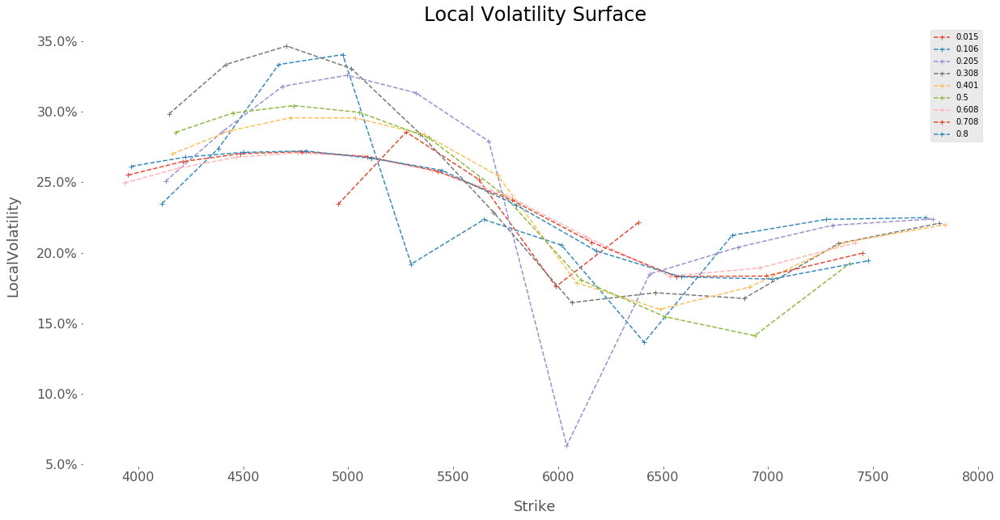

In [67]:
plotMultipleCurve(localVolatility["LocalVolatility"][localVolatility.index.get_level_values("Maturity")>0.01],
                  Title = 'Local Volatility Surface',
                  yMin=0.7*S0[0],
                  yMax=1.4*S0[0], 
                  zAsPercent=True)

In [68]:
#Plotting function for surface
#xTitle : title for x axis
#yTitle : title for y axis
#zTitle : title for z axis
#Title : plot title
#az : azimuth i.e. angle of view for surface
#yMin : minimum value for y axis
#yMax : maximum value for y axis
#zAsPercent : boolean, if true format zaxis as percentage 
def plotGridCustom(coordinates, zValue,
                   xTitle = "Maturity",
                   yTitle = "Strike",
                   zTitle = "Price",
                   Title = 'True Price Surface', 
                   az=320, 
                   yMin = KMin,
                   yMax = KMax,
                   zAsPercent = False):
  y = coordinates[:,0]
  filteredValue = (y > yMin) & (y < yMax)
  x = coordinates[:,1][filteredValue]
  y = coordinates[:,0][filteredValue]
  z = zValue[filteredValue].flatten()
  
  fig = plt.figure(figsize=(20,10))
  ax = fig.gca(projection='3d')
  
  ax.set_xlabel(xTitle, fontsize=18, labelpad=20)
  ax.set_ylabel(yTitle, fontsize=18, labelpad=20)
  ax.set_zlabel(zTitle, fontsize=18, labelpad=10)
  
  cmap=plt.get_cmap("inferno")
  colors=cmap(z * 100 if zAsPercent else z)[np.newaxis, :, :3]
  surf = ax.plot_trisurf(x, y,
                         z * 100 if zAsPercent else z ,
                         linewidth=1.0,
                         antialiased=True, 
                         cmap = cmap,
                         color=(0,0,0,0))
  scaleEdgeValue = surf.to_rgba(surf.get_array())
  surf.set_edgecolors(scaleEdgeValue) 
  surf.set_alpha(0)

  if zAsPercent :
    ax.zaxis.set_major_formatter(mtick.PercentFormatter())
  ax.view_init(elev=10., azim=az)
  ax.set_title(Title, fontsize=24)
  ax.set_facecolor('white')

  plt.tick_params(labelsize=16)

  
  plt.show()


  return

In [69]:
#Plotting function from a dataframe
def plotSurface(data, 
                zName, 
                Title = 'True Price Surface', 
                az=320,
                yMin = KMin,
                yMax = KMax,
                zAsPercent = False):
  plotGridCustom(dataSet.index.to_frame().values, 
                 data[zName].values,
                 xTitle = dataSet.index.names[1],
                 yTitle = dataSet.index.names[0],
                 zTitle = zName,
                 Title = Title, 
                 az=az, 
                 yMin = yMin, 
                 yMax = yMax, 
                 zAsPercent=zAsPercent)
  return

#Plotting function from a pandas series
def plotSerie(data,
              Title = 'True Price Surface',
              az=320,
              yMin = KMin,
              yMax = KMax, 
              zAsPercent = False):
  

  plotGridCustom(data.index.to_frame().values, 
                 data.values,
                 xTitle = dataSet.index.names[1],
                 yTitle = dataSet.index.names[0],
                 zTitle = data.name,
                 Title = Title, 
                 az=az, 
                 yMin = yMin, 
                 yMax = yMax, 
                 zAsPercent = zAsPercent)
  return

In [70]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

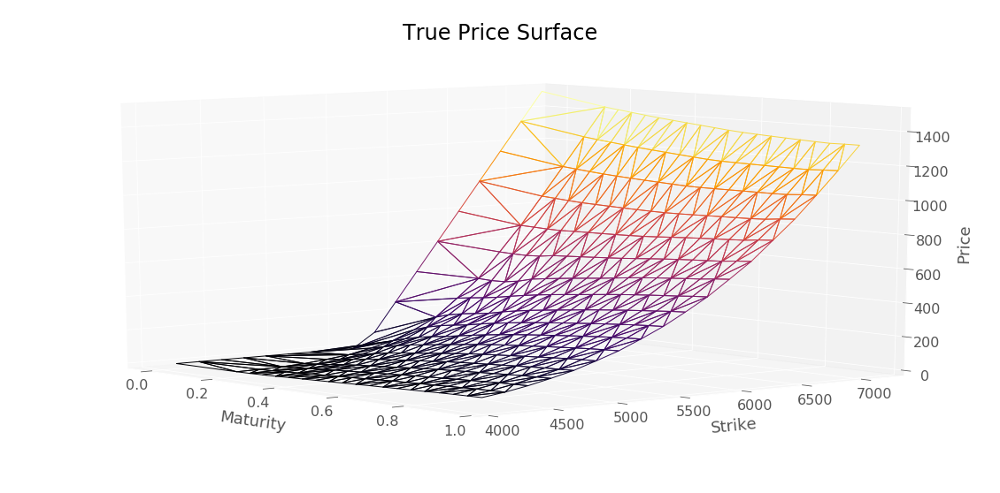

In [71]:
plotSerie(dataSetTest["Price"], Title = 'True Price Surface')

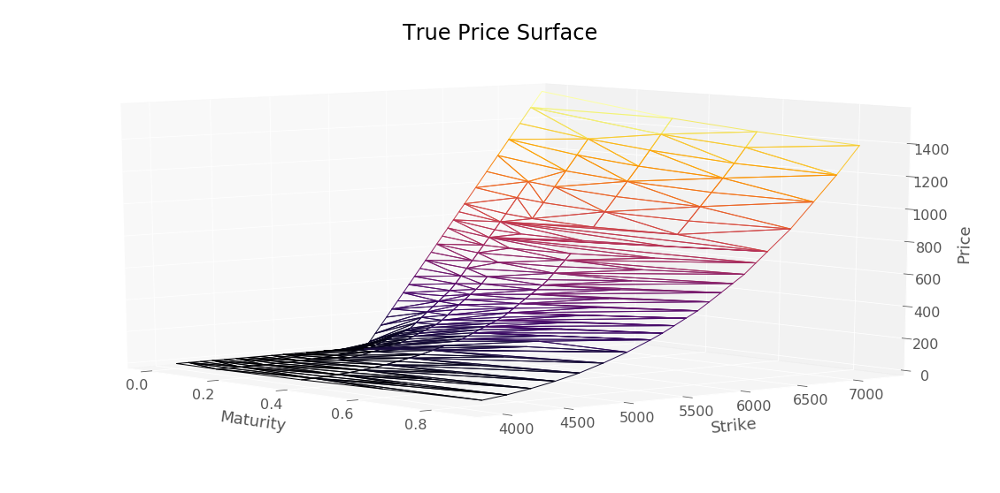

In [72]:
plotSerie(dataSet["Price"], Title = 'True Price Surface')

In [73]:
inverseTransform(scaledDataSet, scaler).head()

Price     Delta        Vega  Delta Strike  Gamma Strike  \
Strike Maturity                                                             
3600   0.000      0.000 -0.000000    0.000000      0.000000      0.000000   
       0.370      0.619 -0.002239   23.985305      0.004755     -0.000006   
       0.600      4.413 -0.010084  116.754870      0.022662     -0.000012   
       0.868     10.910 -0.019355  246.319427      0.045233     -0.000011   
3800   0.000      0.000 -0.000000    0.000000      0.000000      0.000000   

                     Theta  ChangedStrike  DividendFactor  Strike  Maturity  \
Strike Maturity                                                               
3600   0.000      0.000000    3600.000000        1.000000  3600.0     0.000   
       0.370     11.135222    3539.128876        1.000927  3600.0     0.370   
       0.600     37.317873    3507.128191        1.000553  3600.0     0.600   
       0.868     56.637666    3468.598366        1.000878  3600.0     0.868   
3800   0.000      0.000000    3800.000000        1.000000  3800.0     0.000   

                 ImpliedVol     VegaRef  logMoneyness  impliedTotalVariance  \
Strike Maturity                                                               
3600   0.000          0.000    0.000000     -0.444420              0.000000   
       0.370          0.275   10.793249     -0.461474              0.075625   
       0.600          0.274   71.270083     -0.470557              0.075076   
       0.868          0.266  192.114309     -0.481604              0.070756   
3800   0.000          0.000    0.000000     -0.390353              0.000000   

                   locvol  
Strike Maturity            
3600   0.000     0.280101  
       0.370     0.231215  
       0.600     0.235289  
       0.868     0.234563  
3800   0.000     0.280101

In [74]:
#Plot predicted value, benchmark value, absoluate error and relative error
#It also compute RMSE between predValue and refValue
#predValue : approximated value 
#refValue : benchamrk value
#quantityName : name for approximated quantity
#az : azimuth i.e. angle of view for surface
#yMin : minimum value for y axis
#yMax : maximum value for y axis
def predictionDiagnosis(predValue, 
                        refValue, 
                        quantityName, 
                        az=320,
                        yMin = KMin,
                        yMax = KMax):
  
  predValueFiltered = predValue[predValue.index.get_level_values("Maturity") > 0.001]
  refValueFiltered = refValue[refValue.index.get_level_values("Maturity") > 0.001]
  title = "Predicted " + quantityName + " surface"
  plotSerie(predValueFiltered.rename(quantityName), 
            Title = title, 
            az=az,
            yMin = yMin,
            yMax = yMax)
  
  title = "True " + quantityName + " surface"
  plotSerie(refValueFiltered.rename(quantityName), 
            Title = title, 
            az=az,
            yMin = yMin,
            yMax = yMax)
  
  title = quantityName + " surface error"
  absoluteError = np.abs(predValueFiltered - refValueFiltered) 
  plotSerie(absoluteError.rename(quantityName + " Absolute Error"),
            Title = title,
            az=az,
            yMin = yMin,
            yMax = yMax)
  
  title = quantityName + " surface error"
  relativeError = np.abs(predValueFiltered - refValueFiltered) / refValueFiltered
  plotSerie(relativeError.rename(quantityName + " Relative Error (%)"),
            Title = title,
            az=az,
            yMin = yMin,
            yMax = yMax, 
            zAsPercent = True)
  
  print("RMSE : ", np.sqrt(np.mean(np.square(absoluteError))) )
  
  return

#Diagnose Price, theta, gamma and local volatility
def modelSummary(price, 
                 volLocale, 
                 delta_T, 
                 gamma_K, 
                 benchDataset,
                 sigma=0.3, 
                 az=40,
                 yMin = KMin,
                 yMax = KMax):
  priceRef = benchDataset["Price"]
  predictionDiagnosis(price, 
                      priceRef, 
                      "Price",
                      az=320,
                      yMin = yMin,
                      yMax = yMax)
  
  volLocaleRef = benchDataset["locvol"]
  predictionDiagnosis(volLocale, 
                      volLocaleRef, 
                      "Local volatility",
                      az=az,
                      yMin = yMin,
                      yMax = yMax)
  
  dTRef = benchDataset["Theta"]
  predictionDiagnosis(delta_T, 
                      dTRef, 
                      "Theta",
                      az=340,
                      yMin = yMin,
                      yMax = yMax)
  
  gKRef = benchDataset["Gamma Strike"]
  predictionDiagnosis(gamma_K, 
                      gKRef, 
                      "Gamma Strike",
                      az=340,
                      yMin = yMin,
                      yMax = yMax)
  return
  

### Implied volatility function calibration by bissection

In [75]:
def bs_price(cp, s, k, rf, t, v, div):
        """ Price an option using the Black-Scholes model.
        cp: +1/-1 for call/put
        s: initial stock price
        k: strike price
        t: expiration time
        v: volatility
        rf: risk-free rate
        div: dividend
        """
    
        d1 = (np.log(s/k)+(rf-div+0.5*v*v)*t)/(v*np.sqrt(t))
        d2 = d1 - v*np.sqrt(t)

        optprice = (cp*s*np.exp(-div*t)*st.norm.cdf(cp*d1)) - (cp*k*np.exp(-rf*t)*st.norm.cdf(cp*d2))
        
        return optprice

def bissectionMethod(S_0, r, q, implied_vol0, maturity, Strike, refPrice, epsilon):
    calibratedSigma = implied_vol0
    #Call black-scholes price function for initial value
    priceBS = bs_price(-1 ,S0, Strike, r, maturity, calibratedSigma, q)
    sigmaUp = 2.0
    sigmaInf = epsilon
    lossSerie = []
    
    priceMax = bs_price(-1 ,S0, Strike, r, maturity, sigmaUp, q)
    if priceMax < refPrice:
        return priceMax, sigmaUp, pd.Series(lossSerie)
    
    priceMin = bs_price(-1 ,S0, Strike, r, maturity, sigmaInf, q)
    if priceMin > refPrice:
        return priceMin, sigmaInf, pd.Series(lossSerie) 

    #Stop the optimization when the error is less than epsilon
    while(abs(priceBS - refPrice) > epsilon):
        #Update the upper bound or the lower bound 
        #by comparing calibrated price and the target price 
        if priceBS < refPrice : 
            sigmaInf = calibratedSigma
        else :
            sigmaUp = calibratedSigma
        #Update calibratedSigma
        calibratedSigma = (sigmaUp + sigmaInf) / 2
        #Update calibrated price
        priceBS = bs_price(-1 ,S0, Strike, r, maturity, calibratedSigma, q)
        #Record the calibration error for this step
        lossSerie.append(abs(priceBS - refPrice)) 
        
    return priceBS, calibratedSigma, pd.Series(lossSerie)

In [76]:
#Execute calibration of implied volatility from estimated price and benchmark price
#Then plot esitmated implied vol, absolute and relative error
def plotImpliedVol(priceSurface, 
                   refImpliedVol, 
                   rIntegralSpline = None, 
                   qIntegralSpline = None, 
                   az=40,
                   yMin = KMin,
                   yMax = KMax,
                   relativeErrorVolMax = 10):
    return plotImpliedVolConcrete(priceSurface[priceSurface.index.get_level_values("Maturity") > 0.001],
                                  refImpliedVol[refImpliedVol.index.get_level_values("Maturity") > 0.001],
                                  rIntegralSpline = rIntegralSpline,
                                  qIntegralSpline = qIntegralSpline,
                                  az=az,
                                  yMin = yMin,
                                  yMax = yMax,
                                  relativeErrorVolMax = relativeErrorVolMax)

def plotImpliedVolConcrete(priceSurface,
                           refImpliedVol,
                           rIntegralSpline = None,
                           qIntegralSpline = None,
                           az=40,
                           yMin = KMin,
                           yMax = KMax,
                           relativeErrorVolMax = 10):
    df = priceSurface.index.to_frame()
    df["Price"] = priceSurface

    epsilon = 1e-9
    calibrationFunction = lambda x : bissectionMethod(S0, 
                                                      rIntegralSpline(x["Maturity"])/x["Maturity"] if (rIntegralSpline is not None) else r, 
                                                      qIntegralSpline(x["Maturity"])/x["Maturity"] if (qIntegralSpline is not None) else q, 
                                                      0.2, 
                                                      x["Maturity"], 
                                                      x["Strike"], 
                                                      x["Price"], 
                                                      epsilon)[1]

    impliedVol = df.apply(calibrationFunction, axis = 1).rename("Implied Volatility")
    impliedVolError = np.abs(impliedVol-refImpliedVol).rename('Absolute Error')
    relativeImpliedVolError = (impliedVolError / refImpliedVol).rename("Relative error (%)")
    
    plotSerie(impliedVol, 
              Title = 'Implied volatility surface', 
              az=az,
              yMin = yMin,
              yMax = yMax)

    plotSerie(impliedVolError, 
              Title = 'Implied volatility error', 
              az=az,
              yMin = yMin,
              yMax = yMax)
    
    plotSerie(relativeImpliedVolError.clip(0,relativeErrorVolMax / 100.0), 
              Title = 'Implied volatility relative error', 
              az=az,
              yMin = yMin,
              yMax = yMax,
              zAsPercent = True)
  
    print("Implied volalitity RMSE : ", np.sqrt(np.mean(np.square(impliedVolError))) )

    return impliedVol

In [77]:
%matplotlib inline

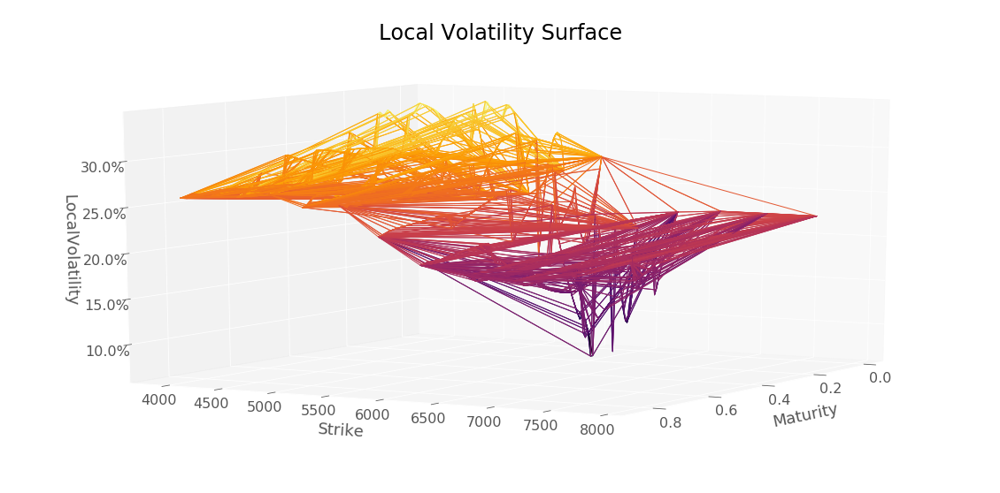

In [78]:
plotSerie(localVolatility["LocalVolatility"],
          Title = 'Local Volatility Surface',
          az=30,
          yMin=0.7*S0,
          yMax=1.4*S0, zAsPercent=True)

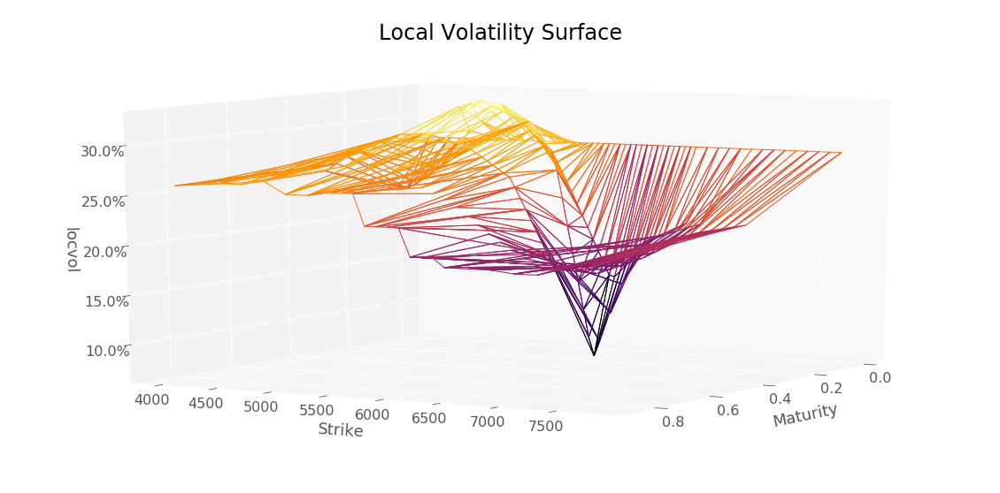

In [79]:
plotSerie(dataSet["locvol"],
          Title = 'Local Volatility Surface',
          az=30,
          yMin=0.7*S0,
          yMax=1.4*S0, zAsPercent=True)

In [80]:
dataSet["locvol"].head()

Strike  Maturity
3600    0.000       0.280101
        0.370       0.231215
        0.600       0.235289
        0.868       0.234563
3800    0.000       0.280101
Name: locvol, dtype: float64

# SSVI Model

In [81]:
import scipy

In [82]:
def blsprice(close, strike, interest_interp, tau_interp, implied_volatility) :
    return generalizedGreeks(-1, close, strike , 
                             riskCurvespline(tau_interp), 
                             tau_interp, 
                             implied_volatility, 
                             divSpline(tau_interp), 
                             riskFreeIntegral(tau_interp),
                             divSpreadIntegral(tau_interp))[0]

def blsimpv(close, K_t, interest_interp, tau_interp, call_price, l):
    epsilon = 1e-9
    dichotomy = lambda x : bissectionMethod(close, 
                                            riskFreeIntegral(tau_interp)/tau_interp, 
                                            divSpreadIntegral(tau_interp)/tau_interp, 
                                            0.2, tau_interp, x[0], 
                                            x[1], epsilon)[1]
    
    data = np.vstack([K_t, call_price]).T
    #data = pd.DataFrame(np.vstack([K_t, call_price]).T, 
    #                    columns = ["Strike","Price"])
    return np.apply_along_axis(dichotomy,1, data)

In [83]:
np.vstack(([0,1,3], [0,1,4])).T

array([[0, 0],
       [1, 1],
       [3, 4]])

In [84]:
def isempty(l):
    return ((l is None) or (numel(l)==0))

def norm(x):
    return np.sqrt(np.sum(np.square(x)))

def error(message):
    raise Exception(message)
    return 

def _assert(predicate, message):
    assert predicate, message
    return

def ismember(elt, l):
    return np.isin(elt, l)

def sqrt(x):
    return np.sqrt(x)

def sign(x):
    return np.sign(x)

def numel(l):
    if type(l)==np.float :
        return 1
    return len(l) if (type(l)==type([]) or type(l)==type(())) else l.size

def ones(shape):
    return np.ones(shape)

def size(array, dim = None):
    return numel(array) if (dim is None) else array.shape[dim] 
    
def isequal(*args):
    return (len(set(args)) <= 1)

def exp(x):
    return np.exp(x)

def unique(x):
    return np.unique(x)

def zeros(x):
    return np.zeros(x)

def idxmin(x):
    return np.unravel_index(np.argmin(x), x.shape)


def fit_ssvi(phifun=None, log_moneyness=None, theta_expanded=None, total_implied_variance=None):
    lb = np.array([-1, 0])
    ub = np.array([1, np.inf])
    c = lambda x: mycon(x, phifun)
    #options = optimset('fmincon')
    #options = optimset(options, 'algorithm', 'interior-point')
    #options = optimset(options, 'Display', 'off')
    targetfun = lambda x: fitfunctionSSVI(x, phifun, log_moneyness, theta_expanded, total_implied_variance)
    # perform optimization N times with random start values
    N = 100
    parameters = np.zeros((size(lb), N))
    funValue = np.zeros((N, 1))
    for n in np.arange(N):
        param0 = generateRandomStartValues(lb, ub)
        #parameters[:, n], funValue[n,1] = fmincon(targetfun, param0, 
        #                                          [], [], [], [], 
        #                                          lb, ub, c, options)
        constraints = (scipy.optimize.NonlinearConstraint(c, 
                                                          -np.inf, 0, 
                                                          keep_feasible=False))
        res = scipy.optimize.minimize(targetfun, param0, 
                                      method="L-BFGS-B", #"trust-constr",#"COBYLA",  
                                      bounds=list(zip(lb, ub)),#[lb, ub],
                                      constraints = constraints) 
        parameters[:, n] = res.x
        funValue[n,0] = res.fun
    
    idMin = idxmin(funValue) 
    parameters = parameters[:, idMin[0]]
    if phifun == 'power_law':
        parameters = np.concatenate((parameters, [0.5]))
    #print("parameters", parameters)
    #print("idMin", idMin)
    #print("res.x", res.x)
    #print("res.fun", res.fun)
    return parameters

def fitfunctionSSVI(x=None, phifun=None, log_moneyness=None, theta=None, total_implied_variance=None):
    # extract parameters from x
    rho = x[0]
    __switch_0__ = phifun
    if __switch_0__ == 'heston_like':
        phi_param = x[1]
    elif __switch_0__ == 'power_law':
        phi_param = [x[1], 0.5]
    else:
        raise Exception('Incorrect function for phi') 
    model_total_implied_variance, _ = svi_surface(log_moneyness, theta, rho, 
                                                  phifun, phi_param, 
                                                  np.ones_like(log_moneyness))
    value = norm(total_implied_variance - model_total_implied_variance)
    return value

def mycon(x=None, phifun=None):
    ceq = 0
    __switch_0__ = phifun
    if __switch_0__ == 'heston_like':
        c = 1 + abs(x[0]) - 4 * x[1]    #by construction, rho is the first parameter, lamda the second
    elif __switch_0__ == 'power_law':
        c = x[1] * (1 + abs(x[0])) - 2    #by construction, rho is the first parameter, lamda the second
    else:
        raise Exception('Incorrect function for phi') 
    return (c, ceq)


def generateRandomStartValues(lb=None, ub=None):
    # function to generate random intial values for the parameters
    lb[~ np.isfinite(lb)] = -1000
    ub[~ np.isfinite(ub)] = 1000
    param0 = lb + np.random.rand(size(lb)) * (ub - lb)
    return param0


In [85]:
list(zip([1,2,3], [4,5,6]))

[(1, 4), (2, 5), (3, 6)]

In [86]:
def fit_svi(x0=None, k=None, 
            total_implied_variance=None, 
            slice_before=None, slice_after=None, 
            tau=None,
            gridPenalization = None,
            param_slice_before = None,
            param_slice_after = None):
    # fit_svi fits a volatility slice to observed implied volatilities. 
    # get variable bounds
    large = 1e5
    small = 1e-6
    lb = [small, -large, small, small, small]
    ub = [large, large, large, large, large]
    targetfun = lambda x: fitfunctionSVI(x, k, 
                                         total_implied_variance, 
                                         slice_before, slice_after, 
                                         tau,
                                         gridPenalization,
                                         param_slice_before, 
                                         param_slice_after)
    # only optimize first three variables, final two are set by no-arbitrage condition
    x0 = x0[:3]
    lb = lb[:3]
    ub = ub[:3]
    # linear inequality: -p <= 2*psi
    A = np.array([0 , -2, -1])
    b = 0
    #print("slice_before",slice_before)
    parameters = None
    fval = np.inf
    constraints = (scipy.optimize.LinearConstraint(np.expand_dims(A, axis=0), 
                                                   b-small, b+small, 
                                                   keep_feasible=False))
    nbRestart = 50
    for i in np.arange(nbRestart):
        res = scipy.optimize.minimize(targetfun, x0, 
                                      method="L-BFGS-B", #"trust-constr",#"COBYLA", 
                                      bounds=list(zip(lb, ub)),#[lb, ub],
                                      constraints = constraints) 
        #res = fmincon(targetfun, x0, A, b, [], [], lb, ub, [], options)
        if (i==0) or (fval > res.fun) :
            fval =  res.fun
            parameters = res.x
    
    # use ga to find solution if optimizer gets stuck
    #if fval >= 1e6:
    #    res1 = scipy.optimize.differential_evolution(targetfun, 
    #                                                 list(zip(lb, ub)),#[lb, ub],
    #                                                 init = [x0])#, constraints = constraints)
    #    fval =  res1.fun
    #    parameters = res1.x
    #else:
    #    res1 = scipy.optimize.differential_evolution(targetfun, 
    #                                                 list(zip(lb, ub)),#[lb, ub],
    #                                                 init = [x0, parameters])#, constraints = constraints)
    #    fval =  res1.fun
    #    parameters = res1.x
    
    return parameters

def fitfunctionSVI(x=None, k=None, 
                   total_implied_variance=None, 
                   slice_before=None, slice_after=None, 
                   tau=None,
                   gridPenalization = None,
                   param_slice_before = None,
                   param_slice_after = None):
    # fitfunction is the objective function of the minimization of fit_svi. The objective is the 2-norm
    # of the error in total implied variance. If specified, the function tests whether the current total
    # variance slice lies between the prior and later slice. If the arbitrage bound is violated, the
    # function is penalized with a very large value.
    #
    # Input:
    # * x = (5x1) = parameters of SVI model
    # * k = (Nx1) = log moneyness at which total implied variance is calculated
    # * total_implied_variance = (Nx1) = market observed total implied variance
    # * slice_before = (Nx1) = total implied variance with smaller maturity than current slice
    # * slice_after = (Nx1) = total implied variance with larter maturity than current slice
    #
    # Output:
    # * value
    # check that input is consistent
    _assert(numel(k) == numel(total_implied_variance), 
            'moneyness and total implied variance need to have the same size')
    if not isempty(slice_before):
        _assert((numel(k) == numel(slice_before)), 
                'moneyness and slice_before need to have the same size')
    
    if not isempty(slice_after):
        _assert((numel(k) == numel(slice_after)), 
                'moneyness and slice_after need to have the same size')
    
    # expand x
    x3 = x[2] + 2 * x[1]
    x4 = x[0] * 4 * x[2] * x3 / (x[2] + x3) ** 2
    newX = np.concatenate((x, np.array([x3,x4]))) 
    # calculate model total implied variance given current parameter estimate
    model_total_implied_variance,_ = svi_jumpwing(k, newX, tau)
    # calculate value of objective function
    value = norm(total_implied_variance - model_total_implied_variance)
    # if the current model total implied variance crosses the earlier or later slice, set value to 1e6
    if not isempty(slice_before) and any(model_total_implied_variance < slice_before):
        value = 1e6
    
    if not isempty(slice_after) and any(model_total_implied_variance > slice_after):
        value = 1e6
    
    if np.isnan(value):
        value = 1e6
    
    if not isempty(gridPenalization) and ((not isempty(param_slice_before)) or 
                                          (not isempty(param_slice_after))):
        model_total_implied_variance,_ = svi_jumpwing(gridPenalization, newX, tau)
        
        if not isempty(param_slice_before):
            before_total_implied_variance,_ = svi_jumpwing(gridPenalization, param_slice_before, tau)
            if any(model_total_implied_variance < before_total_implied_variance) :
                value = 1e6    
                
        if not isempty(param_slice_after):
            after_total_implied_variance,_ = svi_jumpwing(gridPenalization, param_slice_after, tau)
            if any(model_total_implied_variance > after_total_implied_variance) :
                value = 1e6    
    
    return value


In [ ]:
l = np.array([1,2,3,4,5,3,3,5,6])
l[l==5]

array([5, 5])

In [ ]:
np.concatenate((l, np.array([11,12])))

array([ 1,  2,  3,  4,  5,  3,  3,  5,  6, 11, 12])

In [ ]:
l = np.array([[1,2,3], [4,5,6], [7,8,9]])
l[:2,2] = 10
l

array([[ 1,  2, 10],
       [ 4,  5, 10],
       [ 7,  8,  9]])

In [ ]:
def interp1(x, v, xq, method, extrapolationMethod):
    if method=="linear":
        funInter = scipy.interpolate.interp1d(x, v, 
                                              kind=method,
                                              fill_value="extrapolate")
    else :
        funInter = scipy.interpolate.PchipInterpolator(x, v, extrapolate=(extrapolationMethod == "extrapolate"))
    
    return funInter(xq)
    
def fit_svi_surface(implied_volatility=None, maturity=None, log_moneyness=None, phifun=None):
    #fit_svi_surface calibrates the SVI surface to market data. First, the entire Surface SVI is fitted
    #to all log-moneyness-theta observations. Second, each slice is fitted again using the SSVI fit as
    #initial guess.
    #
    # Input:
    # * impliedvolatility, maturity, moneyness, phi
    # Output:
    # * parameters = (2x1) = parameters of SSVI = [rho, lambda]
    # * theta      = (Tx1) = ATM total implied variance
    # * maturities = (Tx1) = corresponding time to maturity
    # step one: estimate total implied variance
    total_implied_variance = np.multiply(np.square(implied_volatility), maturity)
    # step two: use linear interpolation for ATM total implied variance
    maturities = np.sort(np.unique(maturity))
    T = size(maturities)
    theta = np.zeros(T)#np.zeros((T, 1))
    theta_expanded = np.zeros(size(maturity))
    for t in np.arange(T):
        pos = (maturity == maturities[t]) #position corresponding to a slice i.e. a smile
        tiv_t = total_implied_variance[pos]
        if np.isin(0, log_moneyness[pos]):
            theta[t] = tiv_t[log_moneyness[pos] == 0] #ATM total implied variance 
        else:#Interpolate ATM total implied variance from the smile
            theta[t] = interp1(log_moneyness[pos], tiv_t, 0, 'cubic', 'extrapolate') 
        
        theta_expanded[pos] = theta[t]
    

    # step three: fit SVI surface by estimating parameters = [rho, lambda] subject to parameter bounds:
    # -1 < rho < 1, 0 < lambda
    # and constraints: in heston_like: (1 + |rho|) <= 4 lambda, in power-law: eta(1+|rho|) <= 2
    parameters = fit_ssvi(phifun, 
                          log_moneyness, 
                          theta_expanded, 
                          total_implied_variance)
    parametersSSVI = parameters
    print("Parameters of SSVI model : ", parametersSSVI)
    
    rho = parameters[0]
    phi_param = parameters[1:]
    # step four: transform SSVI parameters to SVI-JW parameters
    __switch_0__ = phifun
    #print(phi_param)
    if __switch_0__ == 'heston_like':
        phi = heston_like(theta, phi_param)
    elif __switch_0__ == 'power_law':
        phi = power_law(theta, phi_param)
    else:
        raise Exception('Incorrect function for phi') 
    
    v = np.divide(theta, maturities)
    #print("v.shape", v.shape)
    #print("theta.shape", theta.shape)
    #print("maturities.shape", maturities.shape)
    psi = np.multiply(0.5 * rho * np.sqrt(theta),  phi)
    p = np.multiply(0.5 * np.sqrt(theta), phi * (1 - rho))
    c = p + 2 * psi
    vt = np.divide(np.multiply(v, (4 * np.multiply(p, c))), np.square((p + c)))
    gridPenalization = np.linspace(np.log(2000/S0[0]),
                                   np.log(9000/S0[0]), 
                                   num=200)
    
    #print()
    # step five: iterate through each maturity and fit c and vt for best fit
    parameters = np.zeros((5, T))
    for t in np.arange(T)[::-1]:
        pos = (maturity == maturities[t]) #position for the slice
        log_moneyness_t = log_moneyness[pos] 
        total_implied_variance_t = total_implied_variance[pos] #smile
        #
        if t == (T-1): 
            param_before = [v[t - 1], psi[t - 1], p[t - 1], c[t - 1], vt[t - 1]]
            slice_before,_ = svi_jumpwing(log_moneyness_t, param_before, maturities[t - 1])
            param_after = None
            slice_after = []
        elif t == 0:
            slice_before = []
            param_before = None
            param_after = [v[t + 1], psi[t + 1], p[t + 1], c[t + 1], vt[t + 1]]
            slice_after,_ = svi_jumpwing(log_moneyness_t, param_after, maturities[t + 1])
        else:
            param_before = [v[t - 1], psi[t - 1], p[t - 1], c[t - 1], vt[t - 1]]
            slice_before,_ = svi_jumpwing(log_moneyness_t, param_before, maturities[t - 1])
            param_after = [v[t + 1], psi[t + 1], p[t + 1], c[t + 1], vt[t + 1]]
            slice_after,_ = svi_jumpwing(log_moneyness_t, param_after, maturities[t + 1])
        
        print("time step",t)
        param0 = [v[t], psi[t], p[t], c[t], vt[t]]
        parameters[:3, t] = fit_svi(param0,
                                    log_moneyness_t,
                                    total_implied_variance_t, 
                                    slice_before, slice_after, 
                                    maturities[t], 
                                    gridPenalization,
                                    param_before,
                                    param_after)
        parameters[3, t] = parameters[2, t] + 2 * parameters[1, t]
        parameters[4, t] = np.divide(parameters[0, t] * 4 * parameters[2, t] * parameters[3, t] ,
                                     np.square(parameters[2, t] + parameters[3, t])) 

    return parameters, theta, maturities, parametersSSVI

In [ ]:
def fit_svi_surface_nonlin(x=None):
    ceq = np.zeros((2, 1))
    c = np.zeros((5, 1))
    # c = p+2*psi
    ceq[0] = x[3] - x[2] - 2 * x[1]
    # vt = v*(4*p*c)/(p+c)^2
    ceq[1] = x[4] - (x[0] * 4 * x[2] * x[3]) / ((x[2] + x[3]) ** 2)
    # -p <= 2 psi
    c[0] = -x[2] - 2 * x[1]
    # 2 psi <= c
    c[1] = 2 * x[1] - x[3]
    # vt <= v
    c[2] = x[4] - x[0]
    # -p <= 2psi
    c[3] = -x[2] - 2 * x[1]
    # 2psi <= c
    c[4] = 2 * x[1] - c[3]
    return c, ceq 

def heston_like(theta=None, param=None):
    # Heston-like parameterization
    _lambda = param#[0]
    value = np.multiply(1. / (_lambda * theta), 
                        np.divide(1 - (1 - exp(-_lambda * theta)), (_lambda * theta)))
    return value

def power_law(theta=None, param=None):
    # Power-law parameterization
    eta = param[0]
    gamma = param[1]
    value = np.divide(eta, 
                      np.multiply(np.power(theta, (gamma)), 
                                  np.power((1 + theta), (1 - gamma))))
    return value 

def svi(parameterization=None, k=None, param=None, tau=None):
    #SVI - Stochastic Volatility Inspired parameterization of the implied
    #volatility smile.
    # Input:
    # * parameterization = string = one of: raw, natural, or jumpwing
    # * k = (Nx1) = log-moneyness at which to evaluate the total implied
    # variance
    # * param = (5x1) = parameters:
    #   * a = scalar = level of variance
    #   * b = scalar = slope of wings
    #   * m = scalar = translates smile to right
    #   * rho = scalar = counter-clockwise rotation of smile
    #   * sigma = scalar = reduces ATM curvature of the smile
    # Output:
    # * totalvariance = (Nx1) = estimated total variance at k
    # * impliedvolatility = (Nx1) = estimated implied volatility at (k,tau)
    __switch_0__ = parameterization
    if __switch_0__ == 'raw':
        [totalvariance, impliedvolatility] = svi_raw(k, param, tau)
    elif __switch_0__ == 'natural':
        [totalvariance, impliedvolatility] = svi_natural(k, param, tau)
    elif __switch_0__ == 'jumpwing':
        [totalvariance, impliedvolatility] = svi_jumpwing(k, param, tau)
    else:
        raise Exception('Unknown parameterization specified') 
        
    return totalvariance, impliedvolatility


In [ ]:


def svi_convertparameters(param_old=None, _from=None, to=None, tau=None):
    #svi_convertparameters converts the parameter set of one type of SVI
    #formulation to another. The parameterizations are assumed to be:
    # * raw =(a,b,m,rho, sigma)
    # * natural = (delta, mu, rho, omega, zeta)
    # * jumpwing = (v, psi, p, c, vt)
    #
    # Input:
    # * param_old = (5x1) = original parameters
    # * from = string = formulation of original parameters (raw, natural,
    # jumpwing)
    # * to = string = formulation of new parameters (raw, natural, jumpwings)
    #
    # Output:
    # param_new = (5x1) = new parameters
    # test that input is correct
    _assert(numel(param_old) == 5, ('There have to be five original parameters'))
    if not ((_from == 'raw') or (_from == 'natural') or (_from == 'jumpwing')):
        error('from has to be one of: raw, natural, jumpwing')
    
    if not ((to == 'raw') or (to == 'natural') or (to == 'jumpwing')):
        error('from has to be one of: raw, natural, jumpwing')
    
    if ((to == 'jumpwing') or (_from == 'jumpwing')) and (tau is None):
        error('tau is required for tailwings formulation')
    
    __switch_0__ = _from
    if __switch_0__ == 'raw':
        a = param_old[0]
        b = param_old[1]
        m = param_old[2]
        rho = param_old[3]
        sigma = param_old[4]
        __switch_1__ = to
        if __switch_1__ == 'raw':
            param_new = param_old
        elif __switch_1__ == 'natural':
            omega = 2 * b * sigma / sqrt(1 - rho ** 2)
            delta = a - omega / 2 * (1 - rho ** 2)
            mu = m + rho * sigma / sqrt(1 - rho ** 2)
            zeta = sqrt(1 - rho ** 2) / sigma
            param_new = [delta, mu, rho, omega, zeta]
        elif __switch_1__ == 'jumpwing':
            w = a + b * (-rho * m + sqrt(m ** 2 + sigma ** 2))
            v = w / tau
            psi = 1 / np.sqrt(w) * b / 2 * (-m / sqrt(m ** 2 + sigma ** 2) + rho)
            p = 1 / np.sqrt(w) * b * (1 - rho)
            c = 1 / np.sqrt(w) * b * (1 + rho)
            vt = 1 / tau * (a + b * sigma * sqrt(1 - rho ** 2))
            param_new = [v, psi, p, c, vt]
        
    elif __switch_0__ == 'natural':

        __switch_1__ = to
        if __switch_1__ == 'raw':
            delta = param_old[0]
            mu = param_old[1]
            rho = param_old[2]
            omega = param_old[3]
            zeta = param_old[4]

            a = delta + omega / 2 * (1 - rho ** 2)
            b = omega * zeta / 2
            m = mu - rho / zeta
            sigma = np.sqrt(1 - rho ** 2) / zeta
            param_new = [a, b, m, rho, sigma]
        elif __switch_1__ == 'natural':
            param_new = param_old
        elif __switch_1__ == 'jumpwing':
            param_temp = svi_convertparameters(param_old, 'natural', 'raw', tau)
            param_new = svi_convertparameters(param_temp, 'raw', 'jumpwing', tau)
        
    elif __switch_0__ == 'jumpwing':

        __switch_1__ = to
        if __switch_1__ == 'raw':
            v = param_old[0]
            psi = param_old[1]
            p = param_old[2]
            c = param_old[3]
            vt = param_old[4]
            w = v * tau

            b = np.sqrt(w) / 2 * (c + p)
            rho = 1 - p * np.sqrt(w) / b
            beta = rho - 2 * psi * np.sqrt(w) / b
            alpha = np.sign(beta) * np.sqrt(1 / beta ** 2 - 1)
            m = ((v - vt) * tau / 
                 (b * (-rho + np.sign(alpha) * np.sqrt(1 + alpha ** 2) - alpha * np.sqrt(1 - rho ** 2))))
            #print("m",m)
            #print("tau",tau)
            #print("v",v)
            #print("vt",vt)
            #print("param_old", param_old)
            if m == 0:
                sigma = (vt * tau - w) / b / (sqrt(1 - rho ** 2) - 1)
            else:
                sigma = alpha * m
            
            a = vt * tau - b * sigma * np.sqrt(1 - rho ** 2)

            if sigma < 0:
                sigma = 0
            
            param_new = [a, b, m, rho, sigma]
        elif __switch_1__ == 'natural':
            param_temp = svi_convertparameters(param_old, 'jumpwing', 'raw', tau)
            param_new = svi_convertparameters(param_temp, 'raw', 'natural', tau)
        elif __switch_1__ == 'jumpwing':
            param_new = param_old
        
    return param_new


In [ ]:
np.reshape([np.arange(5), np.arange(5) * 2, np.arange(5) * 3, np.arange(5) * 4],(4,5))[:, 3]

array([ 3,  6,  9, 12])

In [ ]:
np.argwhere(np.array([1,2,3,4]) == 2)[0][0]

1

In [ ]:
def svi_interpolation(log_moneyness=None, tau_interp=None, 
                      forward_interp=None, interest_interp=None, 
                      parameters=None, theta=None, maturities=None, 
                      forward_theta=None, interest_rate_theta=None):
    #svi_interpolation estimates inter/extrapolated SVI
    #
    #Input:
    # * log_moneyness = (Kx1) = log-moneyness at which to evalute volatility slices
    # * tau_interp = scalar = maturity at which to generate volatility slices
    # * forward_interp = scalar = forward prices corresponding to maturities
    # * interest_interp = scalar = interest rates corresponding to maturities
    # * parameters (5xL) = estimated parameters of SVI in jumpwing parameterization
    # * theta (Lx1) = ATM total variance time at which the parameters were estimated
    # * maturities (Lx1) = time to maturity corresponding to theta
    # * forward_theta = (Lx1) = forward prices corresponding to theta
    # * interest_rate_theta = (Lx1) = interest rates corresponding to theta (can be scalar)
    #
    #Output:
    # * total_implied_variance (Kx1) = total_implied_variances for each log_moneyness and tau_interp
    # * implied_volatility (Kx1) = implied volatilities corresponding to total_implied_variance
    # * call_price (Kx1) = call option prices correspongin to total_implied_variance
    #ensure column vectors
    log_moneyness = log_moneyness.flatten()
    theta = theta.flatten()
    maturities = maturities.flatten()
    forward_theta = forward_theta.flatten()
    interest_rate_theta = interest_rate_theta.flatten()
    #ensure scalar input
    _assert(type(tau_interp)==np.float, ('tau_interp has to be scalar'))
    _assert(type(forward_interp)==np.float, ('forward_interp has to be scalar'))
    _assert(type(interest_interp)==np.float, ('interest_interp has to be scalar'))
    #expand scalar input
    if numel(interest_rate_theta) == 1:
        interest_rate_theta = interest_rate_theta * ones(size(theta))
    
    # ensure correct size of input
    _assert(size(parameters, 1) == size(theta, 0), ('parameter set for each theta required'))
    _assert(isequal(size(theta), size(forward_theta), size(interest_rate_theta)), 
            ('theta, forward_theta, and interestrate_theta have to have the same size'))
    # estimate theta for interpolated maturity
    theta_interp = interp1(maturities, theta, tau_interp, 'cubic', 'extrapolate')
    close = S0[0]#np.multiply(forward_interp, exp(-interest_interp * tau_interp))
    if ismember(tau_interp, maturities):
        indexMaturity = np.argwhere(maturities == tau_interp)[0][0]
        total_implied_variance,_ = svi_jumpwing(log_moneyness, parameters[:, indexMaturity], tau_interp)
        implied_volatility = sqrt(total_implied_variance / tau_interp)
        strike = forward_interp * exp(log_moneyness)
        put_price = np.array(blsprice(close, strike, 
                                      interest_interp, 
                                      tau_interp, 
                                      implied_volatility))
    else:
        if min(maturities) < tau_interp and tau_interp < max(maturities):
            # interpolation
            idx = idxmin(abs(tau_interp - maturities))[0]
            # if closest maturity is smaller than tau_interp, make idx one unit larger --> idx is index of
            # smallest maturity larger than tau_interp
            if maturities[idx] < tau_interp:
                idx = idx + 1
            

            alpha_t = (sqrt(theta[idx]) - sqrt(theta_interp)) / (sqrt(theta[idx]) - sqrt(theta[idx - 1]))
            param_interp = alpha_t * parameters[:, idx - 1] + (1 - alpha_t) * parameters[:, idx]
            total_implied_variance,_ = svi_jumpwing(log_moneyness, param_interp, tau_interp)
            implied_volatility = sqrt(total_implied_variance / tau_interp)
            strike = forward_interp * exp(log_moneyness)
            put_price = np.array(blsprice(close, strike, 
                                          interest_interp, 
                                          tau_interp, 
                                          implied_volatility))
            put_price[put_price < 0] = 0
        elif tau_interp < min(maturities):
            # extrapolation for small maturities
            forward_0 = interp1(theta, forward_theta, 0, 'cubic', 'extrapolate')
            strike_1 = forward_0 * exp(log_moneyness)
            put_price_1 = np.maximum(strike_1 - close, 0)

            idx = 0
            total_implied_variance_2,_ = svi_jumpwing(log_moneyness, parameters[:, idx], maturities[idx])
            implied_volatility_2 = sqrt(total_implied_variance_2 / maturities[idx])
            strike_2 = forward_theta[idx] * exp(log_moneyness)
            put_price_2 = np.array(blsprice(close, strike_2, 
                                            interest_rate_theta[idx], 
                                            maturities[idx], 
                                            implied_volatility_2))
            put_price_2[put_price_2 < 0] = 0

            alpha_t = (sqrt(theta[idx]) - sqrt(theta_interp)) / sqrt(theta[idx])
            K_t = forward_interp * exp(log_moneyness)

            put_price = np.multiply(K_t, 
                                    (np.divide(alpha_t * put_price_1, strike_1) + 
                                     np.divide((1 - alpha_t) * put_price_2, strike_2)))
            implied_volatility = blsimpv(close, K_t, interest_interp, tau_interp, put_price, [])
            total_implied_variance = np.power(implied_volatility, 2) * tau_interp
        else:
            # extrapolation for large maturities
            total_implied_variance,_ = svi_jumpwing(log_moneyness, parameters[:, -1], maturities[-1])
            total_implied_variance = total_implied_variance + theta_interp - theta[-1]
            implied_volatility = sqrt(total_implied_variance / tau_interp)
            strike = forward_interp * exp(log_moneyness)
            put_price = np.array(blsprice(close, strike, 
                                          interest_interp, 
                                          tau_interp, 
                                          implied_volatility))
        
    return put_price, implied_volatility, total_implied_variance


In [ ]:
def svi_jumpwing(k=None, param=None, tau=None):
    #SVI - Stochastic Volatility Inspired parameterization of the implied
    #volatility smile. This function implements the jump-wings formulation.
    # Input:
    # * k = (Nx1) = log-moneyness at which to evaluate the total implied
    # variance
    # * param = (5x1) = parameters:
    #   * v = scalar = ATM variance
    #   * psi = scalar = ATM skew
    #   * p = scalar = slope of left/put wing
    #   * c = scalar = slope of right/call wing
    #   * vt = scalar = minimum implied variance
    # Output:
    # * totalvariance = (Nx1) = estimated total variance at k
    # * impliedvolatility = (Nx1) = estimated implied volatility at (k,tau)
    # make sure that input is in column vector format
    k = k.flatten()
    # check that input is consistent
    _assert(numel(param) == 5, 'There have to be five parameters: v, psi, p, c, vt')
    if tau is None:
        error('tau needs to be specified for jump-wings formulation')
    
    v = param[0]
    p = param[2]
    c = param[3]
    vt = param[4]

    # make sure that parameter restrictions are satisfied
    # assert(v >= 0, 'v has to be non-negative');
    # assert(p >= 0, 'p has to be non-negative');
    # assert(c >= 0, 'c has to be non-negative');
    # assert(vt >= 0, 'vt has to be non-negative');
    # convert parameters to raw formulation
    param_raw = svi_convertparameters(param, 'jumpwing', 'raw', tau)
    # calculate total variance
    totalvariance, impliedvolatility = svi_raw(k, param_raw, tau)
    return totalvariance, impliedvolatility


def svi_natural(k=None, param=None, tau=None):
    #SVI - Stochastic Volatility Inspired parameterization of the implied
    #volatility smile. This function implements the natural formulation.
    # Input:
    # * k = (Nx1) = log-moneyness at which to evaluate the total implied
    # variance
    # * param = (5x1) = parameters:
    #   * delta = scalar = level of variance
    #   * mu = scalar = slope of wings
    #   * rho = scalar = translates smile to right,
    #   * omega = scalar = counter-clockwise rotation of smile
    #   * zeta = scalar = reduces ATM curvature of the smile
    # Output:
    # * totalvariance = (Nx1) = estimated total variance at k
    # * impliedvolatility = (Nx1) = estimated implied volatility at (k,tau)
    # make sure that input is in column vector format
    k = k.flatten()
    # check that input is consistent
    _assert(numel(param) == 5, 'There have to be five parameters: a, b, m, rho, sigma')
    if tau is None:
        error('tau needs to be specified in order to return implied volatilities')
    
    delta = param[0]
    mu = param[1]
    rho = param[2]
    omega = param[3]
    zeta = param[4]
    # make sure that parameter restrictions are satisfied
    _assert(omega >= 0, 'omega has to be non-negative')
    _assert(abs(rho) < 1, '|rho| has to be smaller than 1')
    _assert(zeta > 0, 'zeta has to be positive')
    _assert(delta + omega * (1 - rho ** 2) >= 0, 'delta + omega (1-rho^2) has to be non-negative')
    # calculate total variance
    totalvariance = delta + omega / 2 * (1 + zeta * rho * (k - mu) + 
                                         sqrt(np.square(zeta * (k - mu) + rho) + (1 - rho ** 2)))
    # if requested, calculate implied volatility
    impliedvolatility = sqrt(totalvariance / tau)
    return totalvariance, impliedvolatility


def svi_parameter_bounds(parameterization=None):
    # svi_parameter_bounds returns the parameter bounds of an SVI parameterization. The parameters are
    # assumed to be in the following order:
    # raw = [a b m rho sigma]
    # natural = [delta mu rho omega zeta]
    # jumpwing = [v psi p c vt]
    large = 1e5
    __switch_0__ = parameterization
    if 0:
        pass
    elif __switch_0__ == ('raw'):
        lb = [-large, 0 - large - 1, 0]
        ub = [large, large, large, 1, large]
    elif __switch_0__ == ('natural'):
        lb = [-large - large - 1, 0, 0]
        ub = [large, large, 1, large, large]
    elif __switch_0__ == ('jumpwing'):
        lb = [0 - large, 0, 0, 0]
        ub = [large, large, large, large, large]
    else:
        error('Unknown parameterization')
    return lb, ub

In [ ]:
def svi_raw(k=None, param=None, tau=None):
    #SVI - Stochastic Volatility Inspired parameterization of the implied
    #volatility smile. This function implements the raw formulation.
    # Input:
    # * k = (Nx1) = log-moneyness at which to evaluate the total implied
    # variance
    # * param = (5x1) = parameters:
    #   * a = scalar = level of variance
    #   * b = scalar = slope of wings
    #   * m = scalar = translates smile to right
    #   * rho = scalar = counter-clockwise rotation of smile
    #   * sigma = scalar = reduces ATM curvature of the smile
    # Output:
    # * totalvariance = (Nx1) = estimated total variance at k
    # * impliedvolatility = (Nx1) = estimated implied volatility at (k,tau)
    # make sure that input is in column vector format
    k = k.flatten()
    # check that input is consistent
    _assert(numel(param) == 5, ('There have to be five parameters: a, b, m, rho, sigma'))
    if tau is None:
        error('tau needs to be specified in order to return implied volatilities')
    
    a = param[0]
    b = param[1]
    m = param[2]
    rho = param[3]
    sigma = param[4]

    # make sure that parameter restrictions are satisfied
    # assert(b >= 0, 'b has to be non-negative');
    # assert(abs(rho) <= 1, '|rho| has to be smaller than 1');
    # assert(sigma >= 0, 'sigma has to be positive');
    # assert(a + b*sigma*sqrt(1-rho^2)>=0, 'a + b sigma (1-rho^2)^0.5 has to be non-negative');
    # calculate total variance
    totalvariance = a + b * (rho * (k - m) + sqrt(np.square(k - m) + sigma ** 2))
    # if requested, calculate implied volatility
    impliedvolatility = sqrt(totalvariance / tau)
    return totalvariance, impliedvolatility



In [ ]:
def svi_surface(k=None, theta=None, rho=None, phifun=None, phi_param=None, tau=None):
    #svi_surface calcualtes the surface SVI free of statis arbitrage.
    #
    # Input:
    # * k = (Kx1) = moneyness at which to evaluate the surface
    # * theta = (Tx1) = ATM variance time at which to evaluate the surface.
    # If theta and k have the same dimensions, then the surface is evaluated 
    # for each given (k,theta) pair. If the dimensions are different, the 
    # function evaluates the surface on the grid given by k and theta
    # * param = (Xx1) = parameters of the surface
    #
    # Output:
    # * totalvariance = (KxT) or (Kx1) = estimated total variance
    # * impliedvolatility = (KxT) or (Kx1) = estimated implied volatility
    # ensure correct input
    k = k.flatten()
    theta = theta.flatten()
    _assert(numel(rho) == 1, 'rho has to be a scalar')
    if tau is None:
        error(('Implied volatility calculation requires tau'))
    
    #evaluate phi
    __switch_0__ = phifun
    if __switch_0__ == 'heston_like':
        phi = heston_like(theta, phi_param)
    elif __switch_0__ == 'power_law':
        phi = power_law(theta, phi_param)
    else:
        error('Incorrect function for phi')
    

    if isequal(size(k), size(theta)):
        totalvariance = np.multiply(theta / 2,
                                    (1 + rho * np.multiply(phi, k) + 
                                     sqrt( np.square(np.multiply(phi, k) + rho) + (1 - rho ** 2))) )
    else:
        T = size(theta)
        K = size(k)
        totalvariance = zeros((K, T))
        for t in np.arange(T):
            totalvariance[:, t] = np.multiply(theta[t] / 2,
                                              (1 + rho * phi[t] * k + 
                                               sqrt(np.square(np.multiply(phi[t], k) + rho) + (1 - rho ** 2))))
        
    
    if isequal(size(k), size(theta), size(tau)):
        impliedvolatility = sqrt(np.divide(totalvariance, tau))
    else:
        # expand tau
        tau_expanded = zeros(totalvariance.shape)
        maturities = unique(tau)
        T = size(maturities)
        for t in np.arange(T):
            tau_expanded[:, t] = maturities[t]
            
        impliedvolatility = sqrt(np.divide(totalvariance, tau_expanded))
        
    return totalvariance, impliedvolatility

def heston_like(theta=None, param=None):
    # Heston-like parameterization
    _lambda = param#[0]
    value = np.multiply(1. / (_lambda * theta), 
                        (1 - np.divide((1 - exp(-_lambda * theta)), 
                                       (_lambda * theta))))
    return value

def power_law(theta=None, param=None):
    # Power-law parameterization
    eta = param[0]
    gamma = param[1]
    value = np.divide(eta, np.multiply(np.power(theta, gamma), 
                                       np.power(1 + theta , 1 - gamma) ) )
    return value



In [ ]:
dataSet = dataSet[dataSet["Maturity"] > 0]
dataSetTest = dataSetTest[dataSetTest["Maturity"] > 0]


In [ ]:
parameters, theta, maturities, pSSVI = fit_svi_surface(dataSet["ImpliedVol"].values, 
                                                       dataSet["Maturity"].values, 
                                                       dataSet["logMoneyness"].values, 
                                                       'power_law')

/home/chataigner/anaconda3/lib/python3.7/site-packages/scipy/optimize/_minimize.py:520: RuntimeWarning: Method L-BFGS-B cannot handle constraints.
  RuntimeWarning)
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in sqrt


Parameters of SSVI model :  [-0.56784917  0.42595905  0.5       ]
time step 4
time step 3


/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning: invalid value encountered in sqrt
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:91: RuntimeWarning: invalid value encountered in sqrt
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in sqrt
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in less
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:105: RuntimeWarning: invalid value encountered in greater
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:117: RuntimeWarning: invalid value encountered in less
/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: RuntimeWarning: invalid value encountered in greater


time step 2
time step 1
time step 0


In [ ]:
dataSet["Forward"] = np.exp(-dataSet["logMoneyness"]) * dataSet["Strike"]
#round for float comparaison
forward_theta = (dataSet["Forward"][dataSet["Maturity"].isin(maturities)]
                 .round(decimals=9)
                 .droplevel("Strike")
                 .drop_duplicates()
                 .loc[maturities].values)
interestrate_theta = riskFreeIntegral(maturities)/maturities

/home/chataigner/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [ ]:
tau_interp = 30/365.25

forward_interp = interp1(maturities, 
                         forward_theta, 
                         tau_interp, 
                         'cubic',
                         "extrapolate")
interest_interp = riskCurvespline(tau_interp)

In [ ]:
interestrate_theta

array([0.0451258 , 0.04472574, 0.04358621, 0.04263943, 0.04182704])

In [ ]:
def interpolateGrid(df):
    impliedVolInterpolated = pd.Series()
    #print(df.head())
    for smile in df.rename({"Maturity" : "MaturityColumn"}, axis=1).groupby("MaturityColumn"):
        maturity = smile[0]
        tau_interp = maturity
        k = smile[1]["logMoneyness"].values
        forward_interp = interp1(maturities, 
                                 forward_theta, 
                                 tau_interp, 
                                 'cubic',
                                 "extrapolate")
        interest_interp = riskCurvespline(tau_interp)
        call_price, implied_volatility, total_implied_variance = svi_interpolation(k,
                                                                                   tau_interp, 
                                                                                   float(forward_interp), 
                                                                                   float(interest_interp), 
                                                                                   parameters, 
                                                                                   theta, 
                                                                                   maturities, 
                                                                                   forward_theta, 
                                                                                   interestrate_theta)
        impliedVolInterpolated = impliedVolInterpolated.append(pd.Series(implied_volatility, index=smile[1].index))

    index = pd.MultiIndex.from_tuples(impliedVolInterpolated.index.tolist(), 
                                      names=["Strike", "Maturity"])
    
    return pd.Series(impliedVolInterpolated.values, index=index).sort_index()
    

In [ ]:
serie = interpolateGrid(dataSetTest[dataSetTest["Maturity"] > 0])

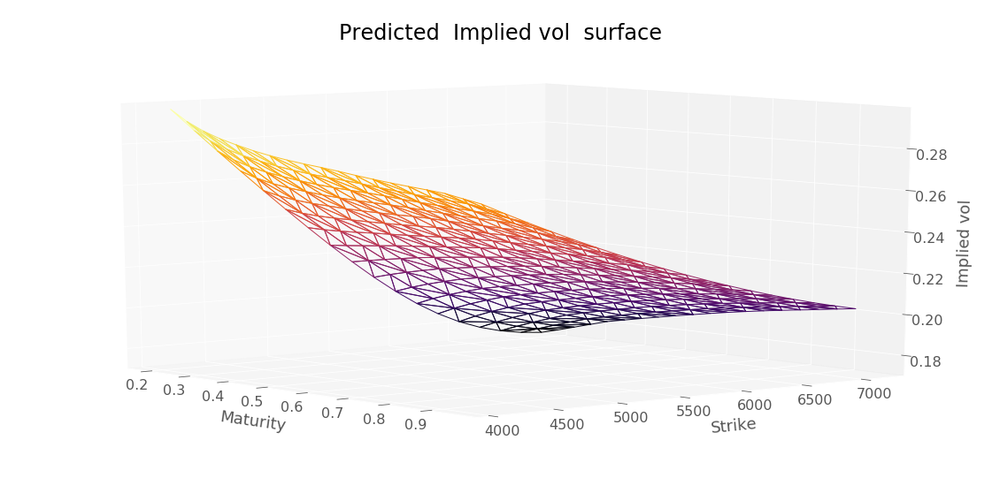

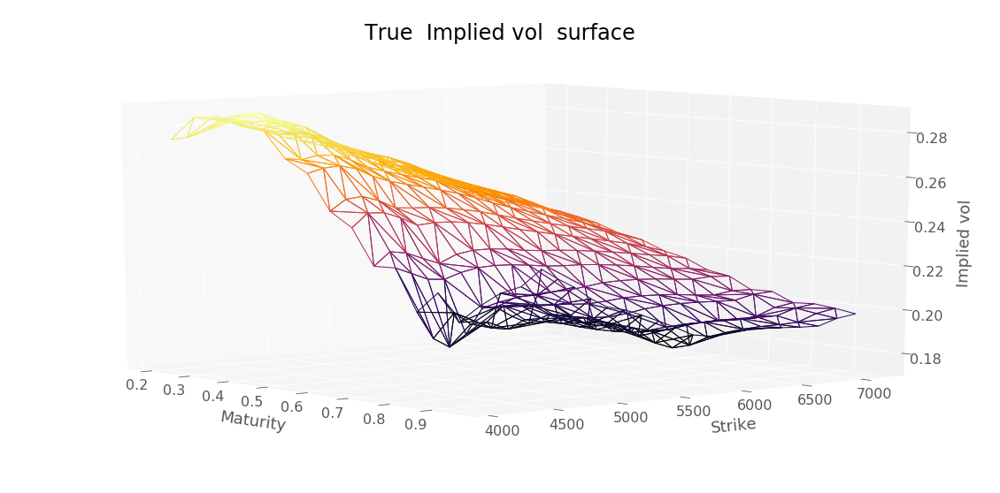

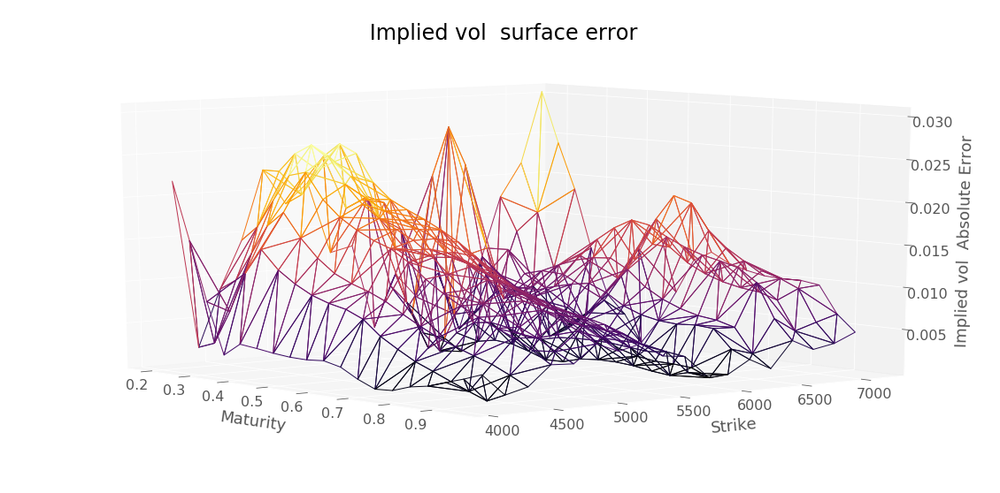

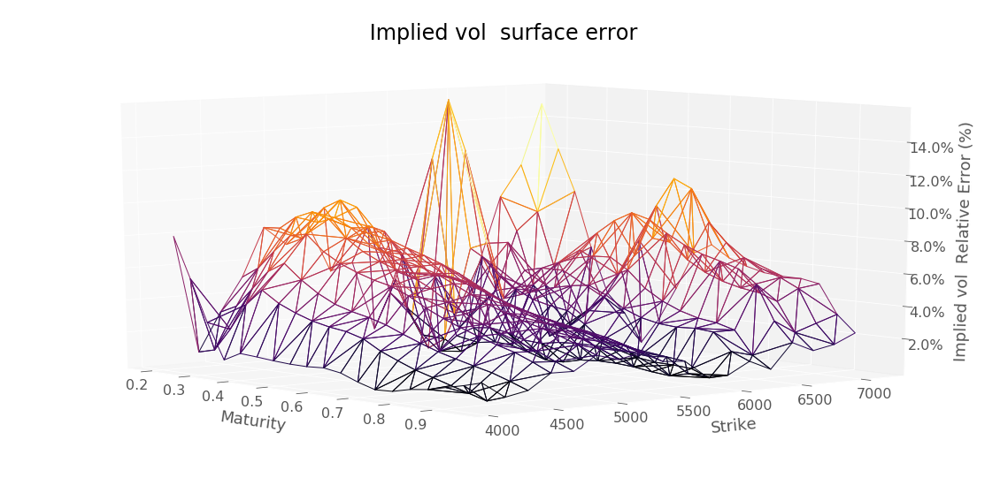

RMSE :  0.011426786926345332


In [ ]:
predictionDiagnosis(serie, 
                    dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                    " Implied vol ", 
                    yMin=-1000)

In [ ]:
def interpolateWithSSVI(df):
    logMoneyness = df[df["Maturity"] > 0]["logMoneyness"].values
    tau = df[df["Maturity"] > 0]["Maturity"].values
    impliedATMTotalVar = interp1(maturities, theta, tau, 'cubic', "extrapolate")
    impliedTotalVar, impliedVol =  svi_surface(k=logMoneyness, 
                                               theta=impliedATMTotalVar, 
                                               rho=pSSVI[0], 
                                               phifun="power_law", 
                                               phi_param=pSSVI[1:], 
                                               tau=tau)
    return pd.Series(impliedVol,index = df[df["Maturity"] > 0].index)

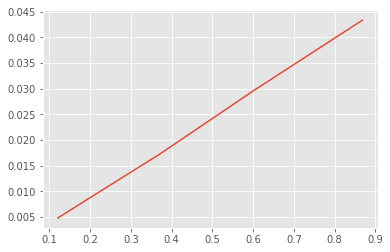

In [ ]:
plt.plot(maturities, theta)#np.sqrt(theta/maturities))#theta)

In [ ]:
dataSet[abs(dataSet.logMoneyness)<=0.01].ImpliedVol

Strike  Maturity
5600    0.121       0.212
5650    0.121       0.200
        0.197       0.210
5700    0.121       0.207
        0.197       0.209
        0.370       0.216
5750    0.370       0.215
5800    0.600       0.220
        0.868       0.224
Name: ImpliedVol, dtype: float64

In [ ]:
#serieDf = interpolateWithSSVI(dataSetTest)
serieDf = interpolateGrid(dataSetTest)

In [ ]:
def impliedVariance(impVol, mat=None):
    Ts = impVol.index.get_level_values("Maturity") if mat is None else mat
    return np.square(impVol) * Ts

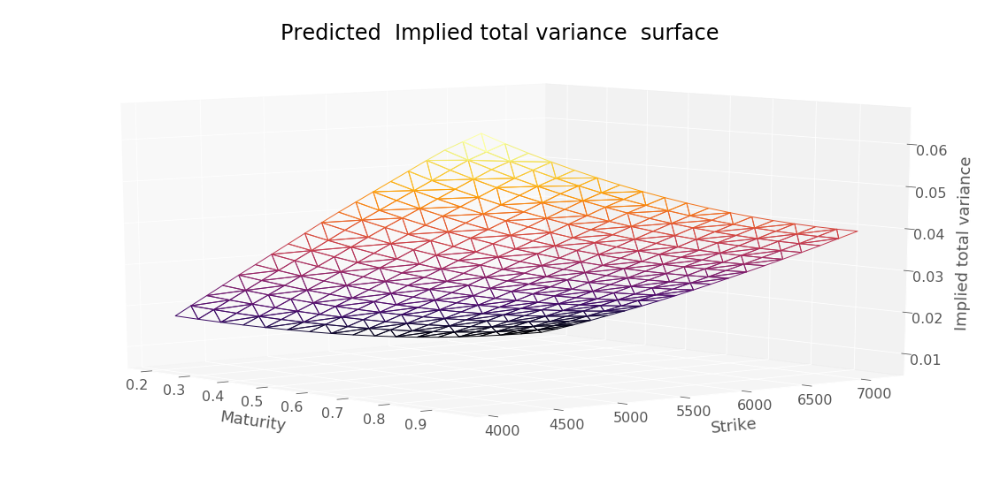

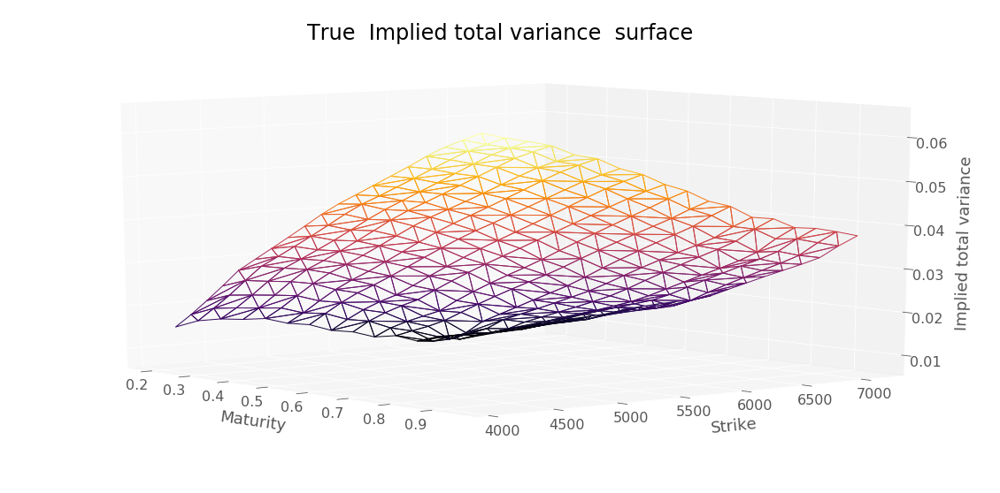

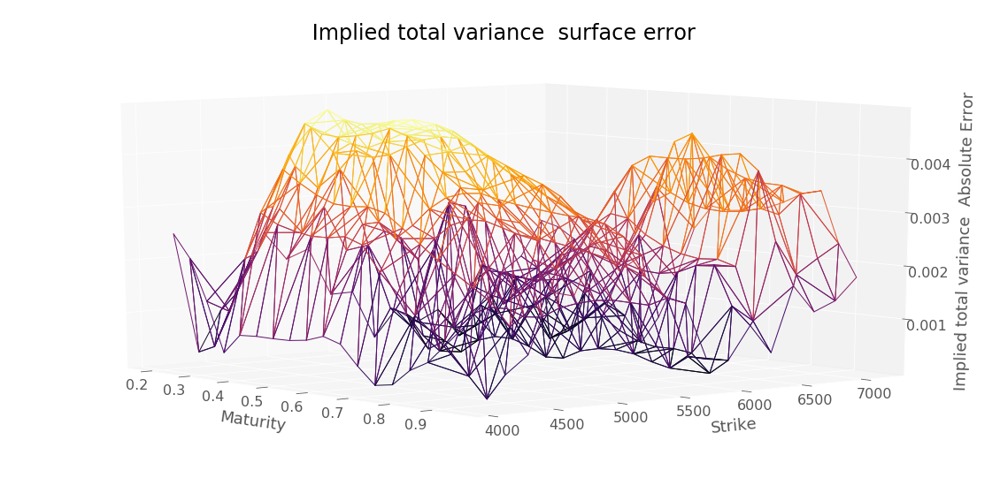

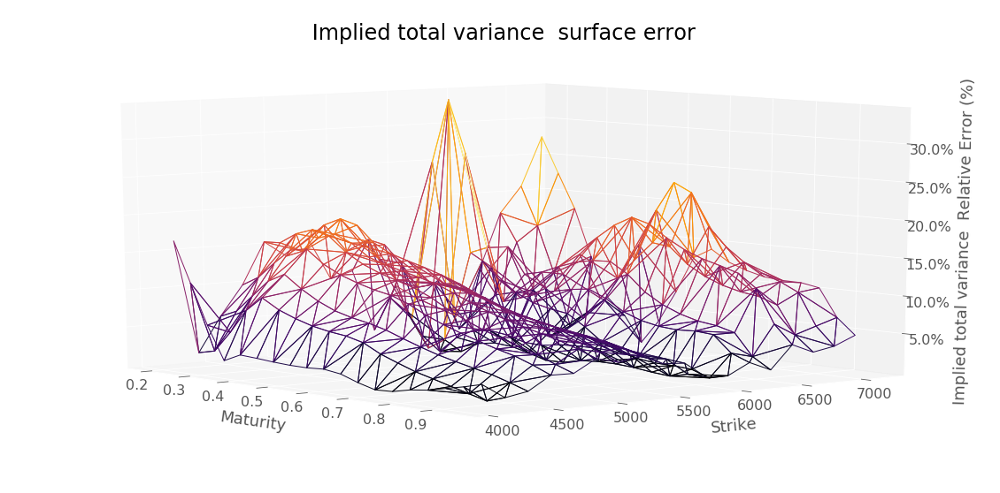

RMSE :  0.0025657095877758317


In [ ]:
predictionDiagnosis(impliedVariance(serieDf), 
                    impliedVariance(dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"]), 
                    " Implied total variance ", 
                    yMin=-1000)

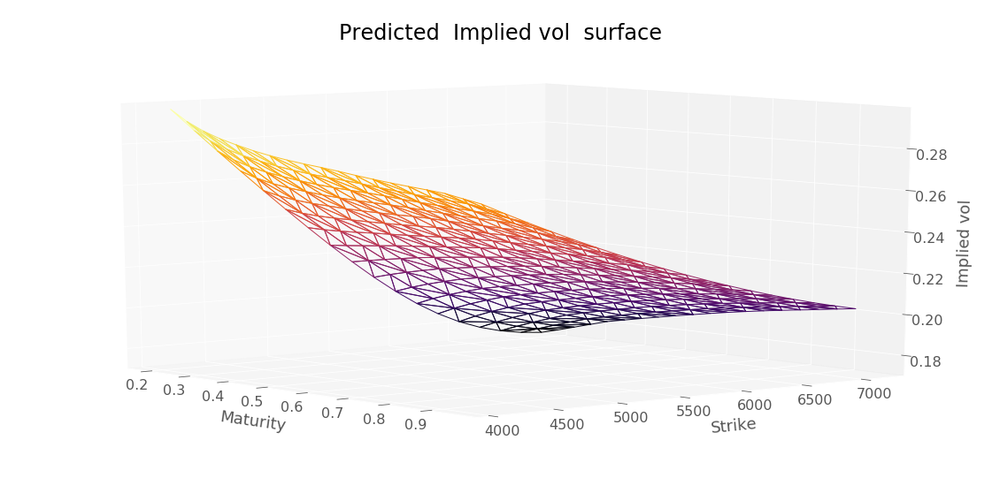

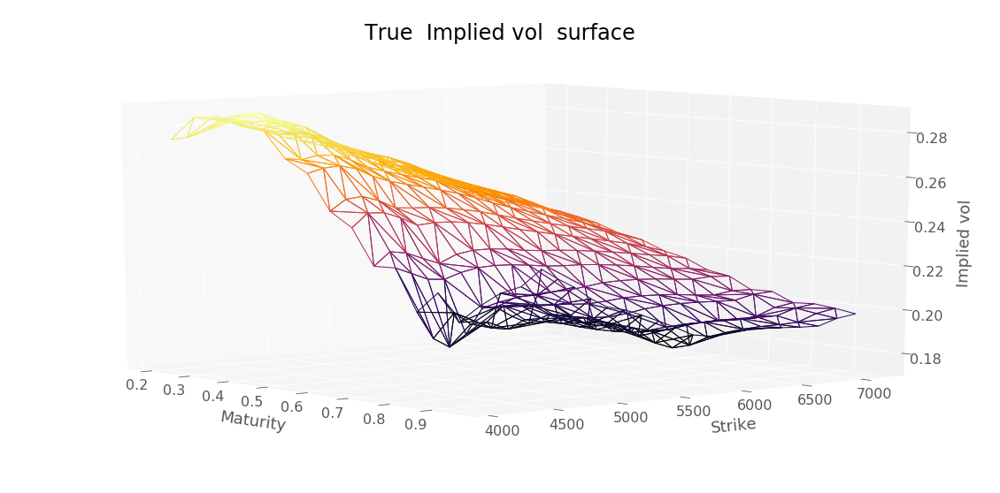

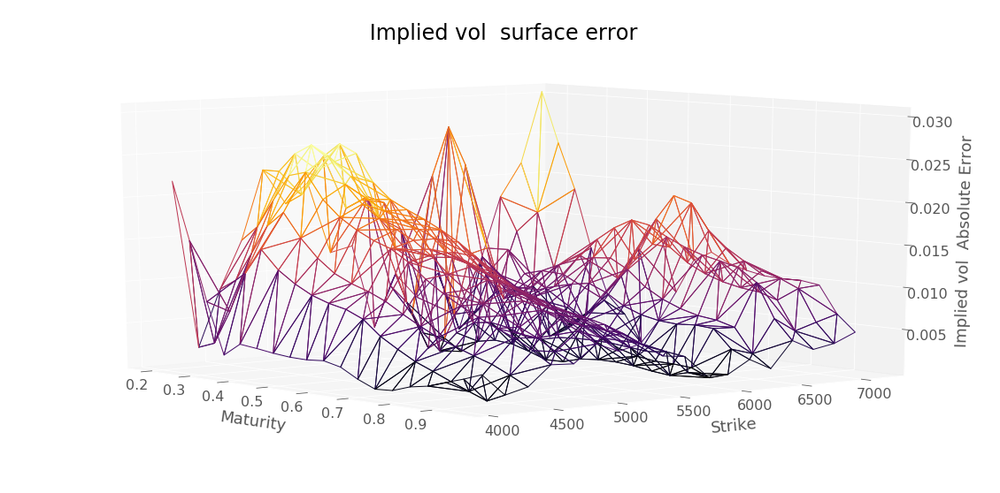

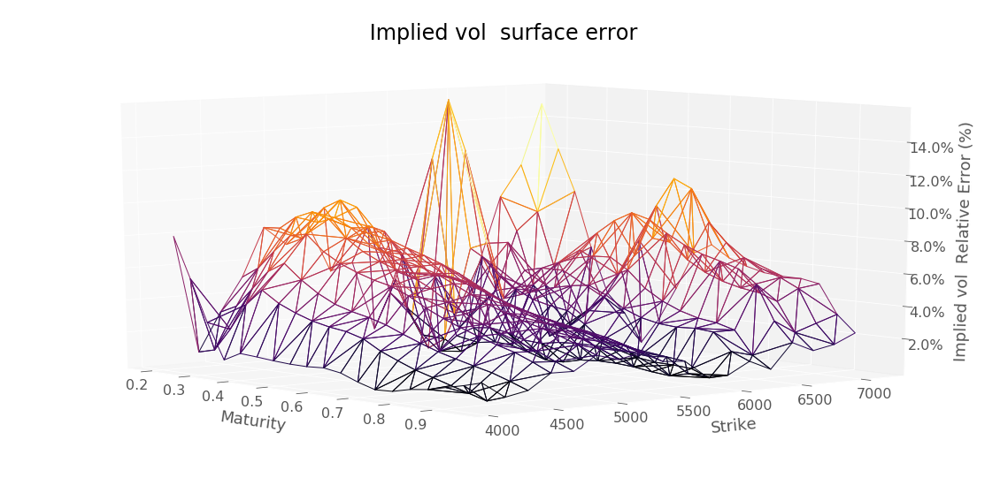

RMSE :  0.011426786926345332


In [ ]:
predictionDiagnosis(serieDf, 
                    dataSetTest[dataSetTest["Maturity"] > 0]["ImpliedVol"], 
                    " Implied vol ", 
                    yMin=-1000)

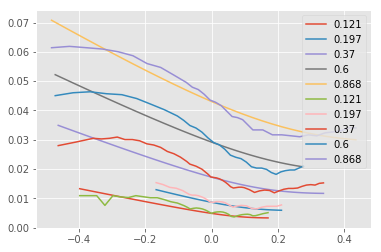

In [ ]:
def plotEachSmile(df):
    for smile in df.rename({"Maturity" : "MaturityColumn"}, axis=1).groupby("MaturityColumn"):
        impliedTotVariance = np.square(smile[1]["ImpliedVol"]) * smile[1]["MaturityColumn"]
        plt.plot(smile[1]["logMoneyness"].values, impliedTotVariance.values, label = str(smile[0]))
    plt.legend()
    return

def plotEachSmilePred(df, interpMethod):
    pred = interpMethod(df)
    for smile in pred.groupby("Maturity"):
        maturities = smile[1].index.get_level_values("Maturity")
        impliedTotVariance = np.multiply(np.square(smile[1].values), maturities)
        plt.plot(df.loc[smile[1].index]["logMoneyness"], impliedTotVariance, label = str(smile[0]))
    plt.legend()
    return
    

plotEachSmilePred(dataSet, interpolateGrid)
plotEachSmile(dataSet)
plt.show()

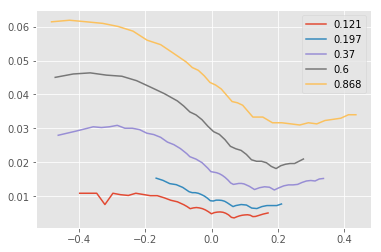

In [ ]:
plotEachSmile(dataSet)
plt.show()

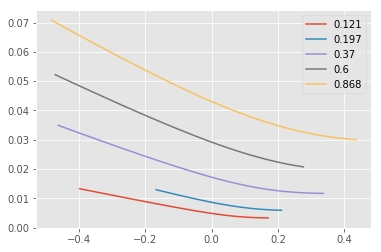

In [ ]:
plotEachSmilePred(dataSet, interpolateGrid)
plt.show()

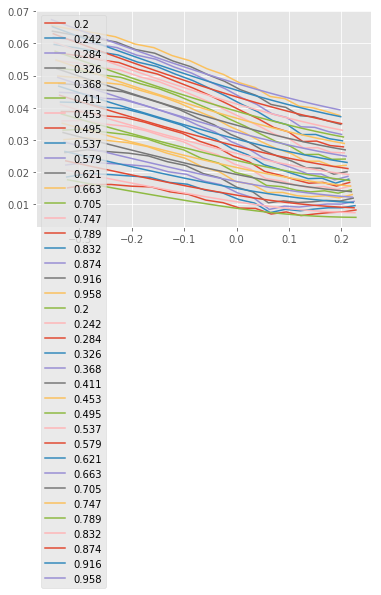

In [ ]:
plotEachSmile(dataSetTest)
plotEachSmilePred(dataSetTest, interpolateGrid)
plt.show()

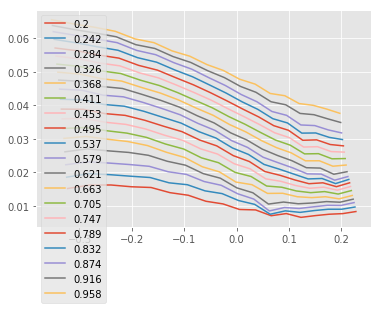

In [ ]:
plotEachSmile(dataSetTest)
plt.show()

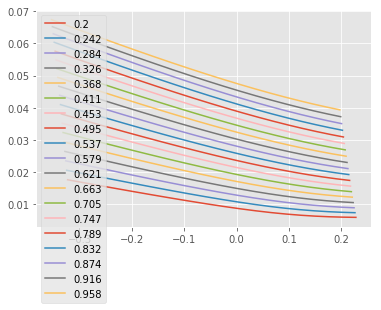

In [ ]:
plotEachSmilePred(dataSetTest, interpolateGrid)
plt.show()

In [ ]:
def finiteDifferenceSVI(xSet, sviEvalModel):
    strikeStep = 0.0001
    maturityStep = 0.0001
    
    moneynesses = np.exp(xSet.logMoneyness) 
    x = moneynesses = xSet.logMoneyness
    maturities = xSet.Maturity
    
    xSetShifted = xSet.copy(deep=True)
    xSetShifted["logMoneyness"] = xSetShifted["logMoneyness"]  + strikeStep  
    gridStrikeUp = impliedVariance(sviEvalModel(xSetShifted))
    
    xSetShifted["logMoneyness"] = xSetShifted["logMoneyness"] - 2 * strikeStep  
    gridStrikeLow = impliedVariance(sviEvalModel(xSetShifted)) 
    
    gridStrikeMid = impliedVariance(sviEvalModel(xSet)) 
    
    hk = pd.Series((gridStrikeUp + gridStrikeLow - 2 * gridStrikeMid) / (strikeStep**2), 
                   index = xSet.index)
    dK = pd.Series((gridStrikeUp - gridStrikeLow ) / (2 * strikeStep), 
                   index = xSet.index)
    
    xSetShifted["logMoneyness"] = xSetShifted["logMoneyness"]  + strikeStep  
    xSetShifted["Maturity"] = xSetShifted["Maturity"]  + maturityStep  
    gridMaturityUp = impliedVariance(sviEvalModel(xSetShifted), mat = xSetShifted["Maturity"].values)
    
    xSetShifted["Maturity"] = xSetShifted["Maturity"] - 2 * maturityStep  
    gridMaturityLow = impliedVariance(sviEvalModel(xSetShifted), mat = xSetShifted["Maturity"].values)
    dT = pd.Series((gridMaturityUp - gridMaturityLow) / (2 * maturityStep), 
                   index = xSet.index)
    
    numerator = (1 - np.divide(x, gridStrikeMid) * dK + 
                 0.25 * ( -0.25 - np.divide(1, gridStrikeMid) + 
                         np.square(np.divide(x, gridStrikeMid.values)) ) * np.square(dK) + 
                 0.5 * hk )
    locVolGatheral = np.sqrt(dT / numerator)
    
    return dT, hk, dK, locVolGatheral, numerator

In [ ]:
#dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSet, interpolateWithSSVI)
dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(dataSetTest, interpolateGrid)

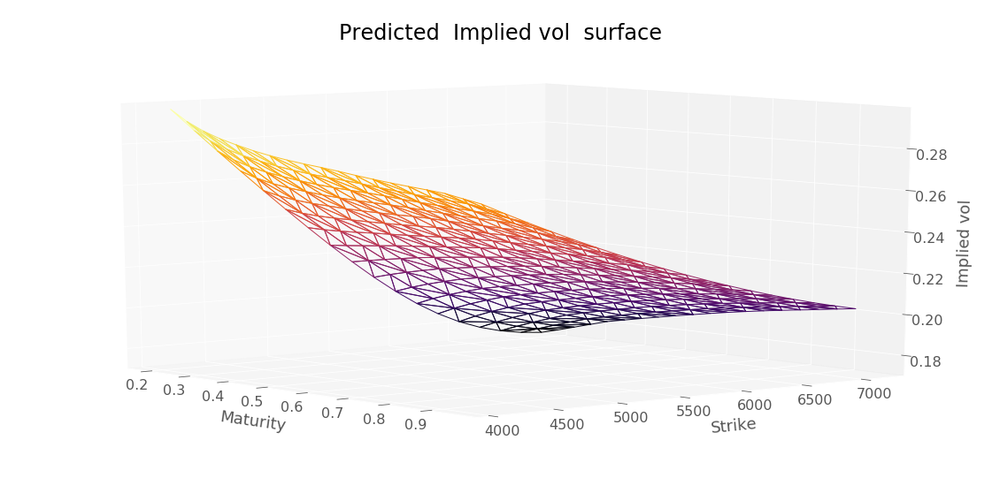

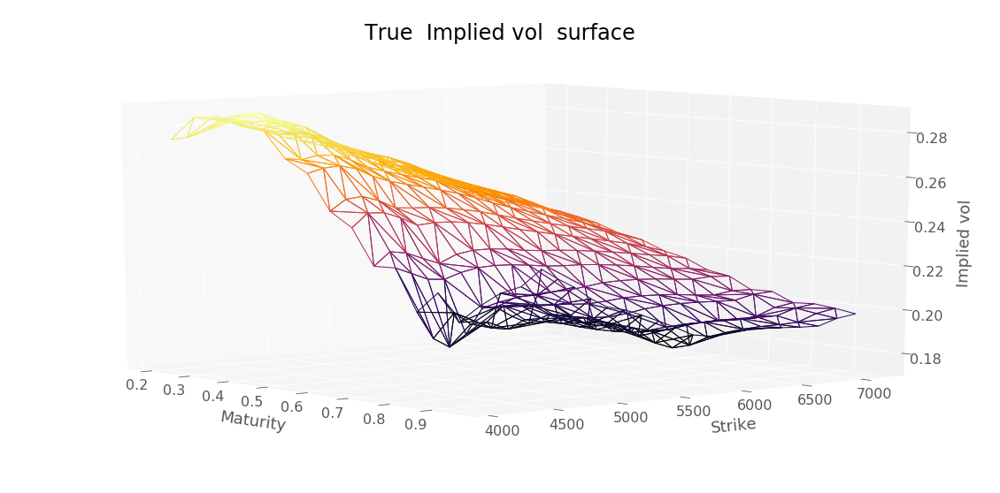

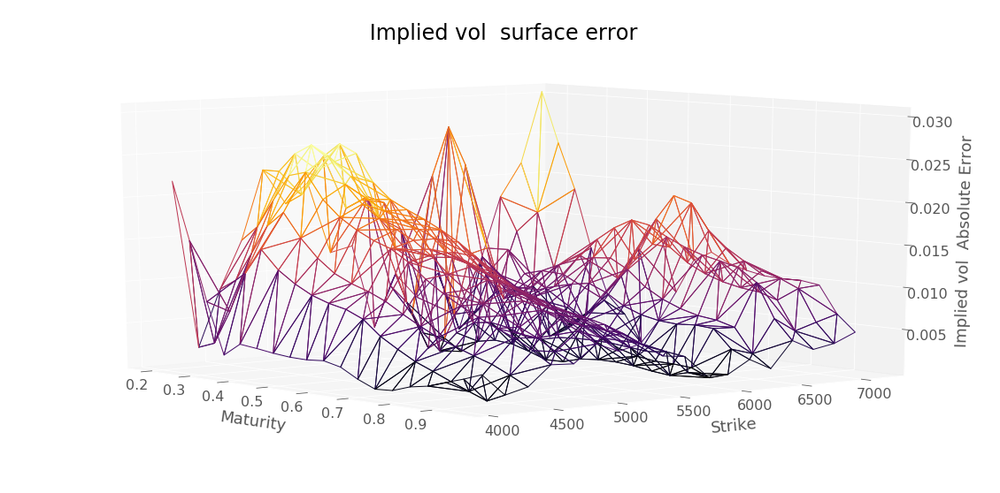

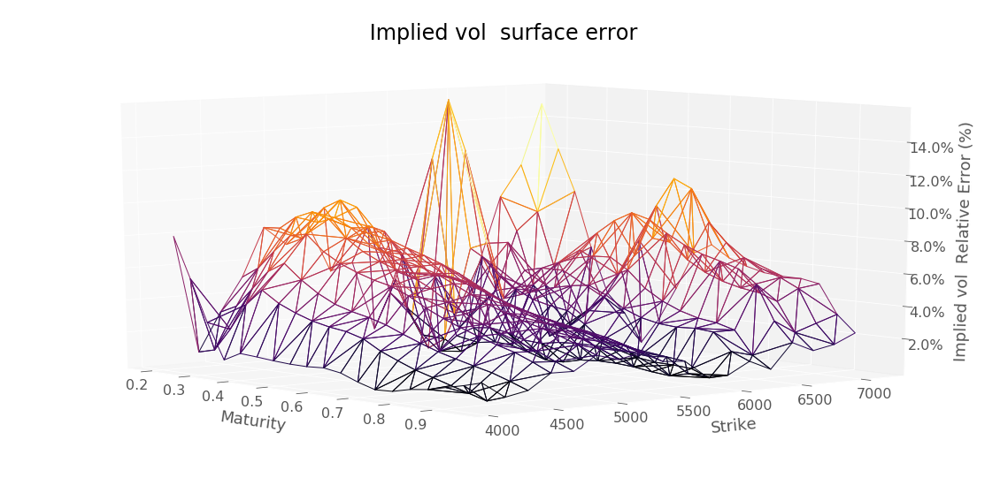

RMSE :  0.011426786926345332


In [ ]:
predictionDiagnosis(serie, dataSetTest["ImpliedVol"], " Implied vol ", yMin=-1000)

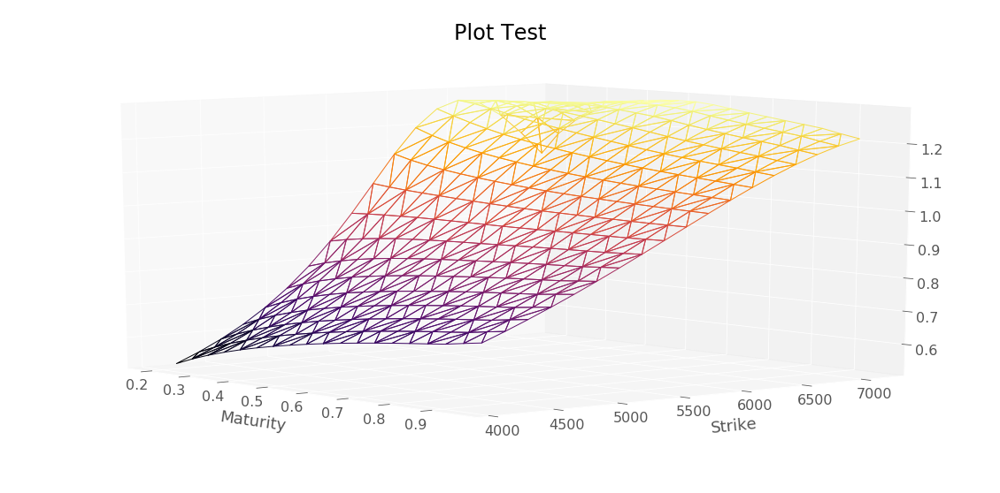

In [ ]:
plotSerie(density,
          Title = 'Plot Test',
          az=320,
          yMin=0,
          yMax=10000)

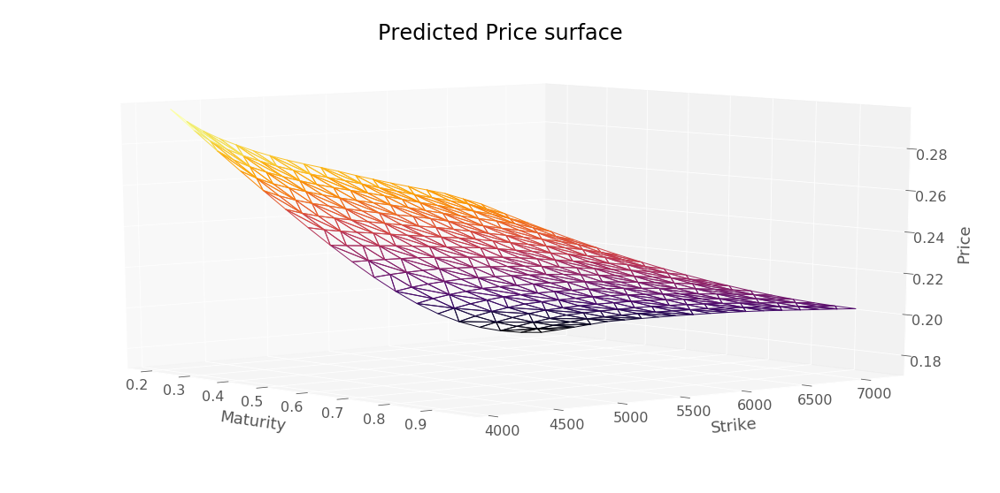

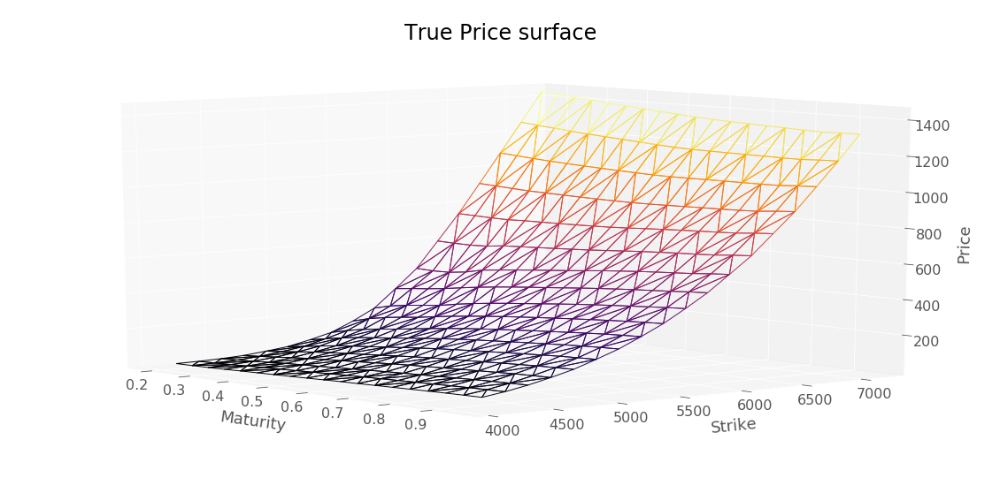

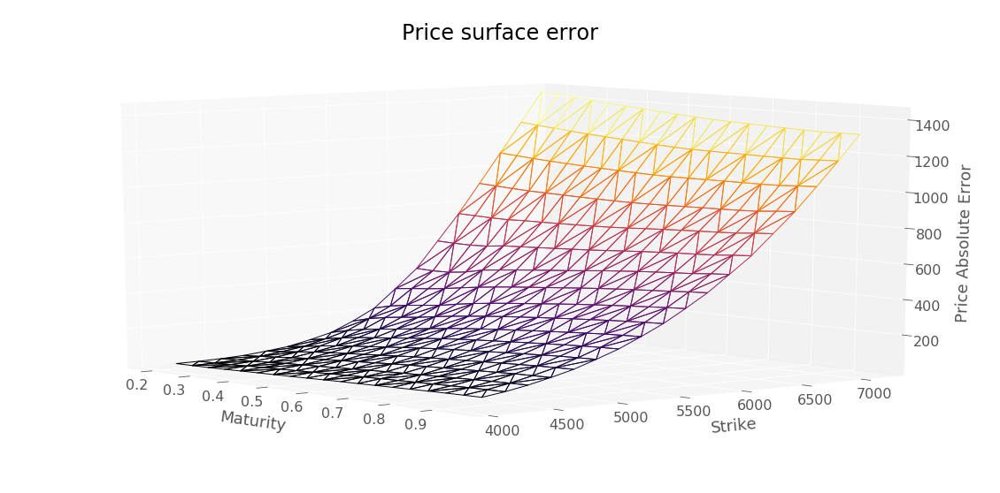

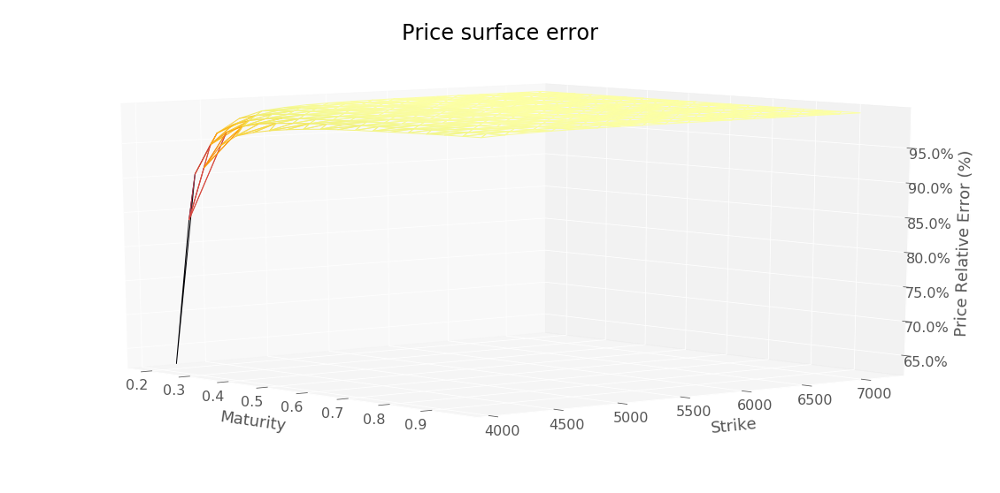

RMSE :  622.857281917437


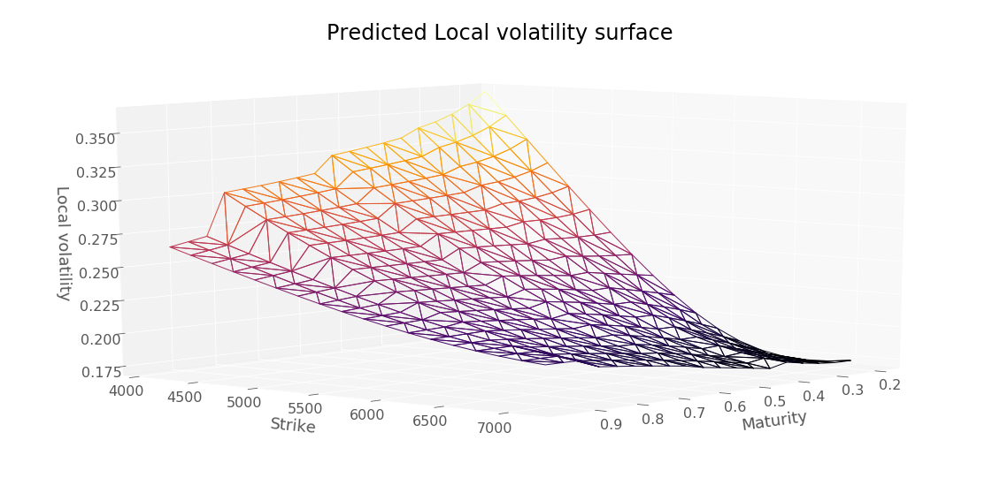

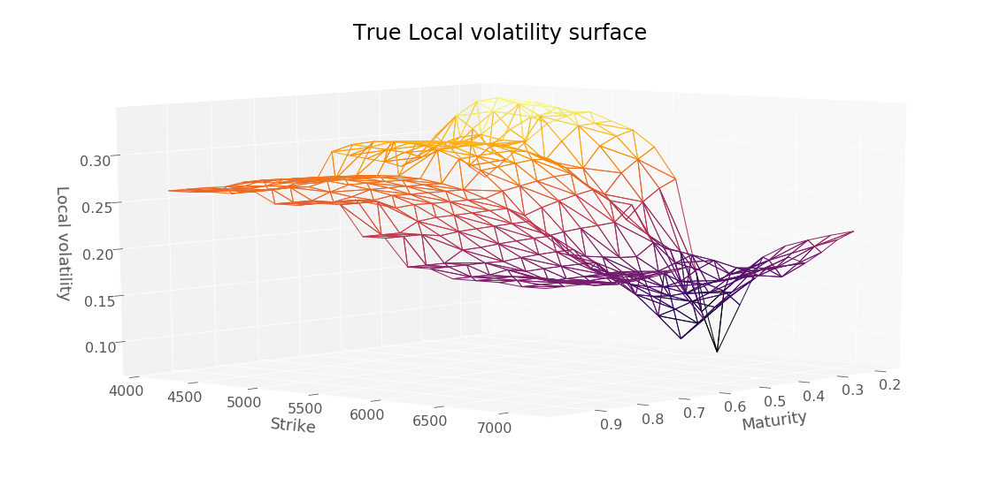

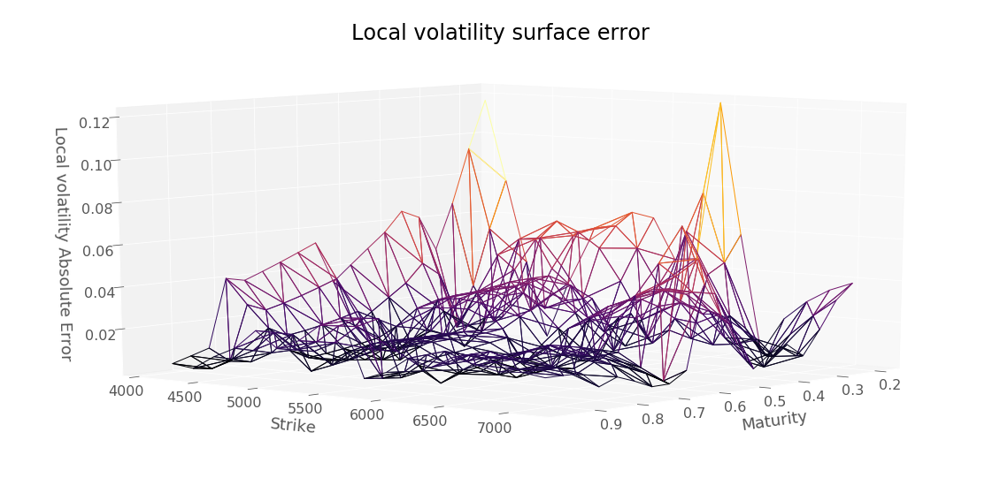

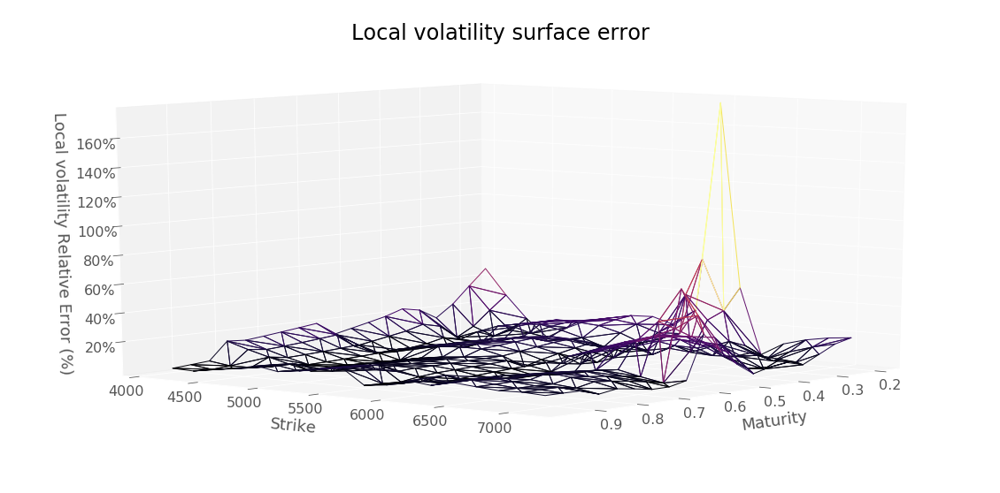

RMSE :  0.02877160167813175


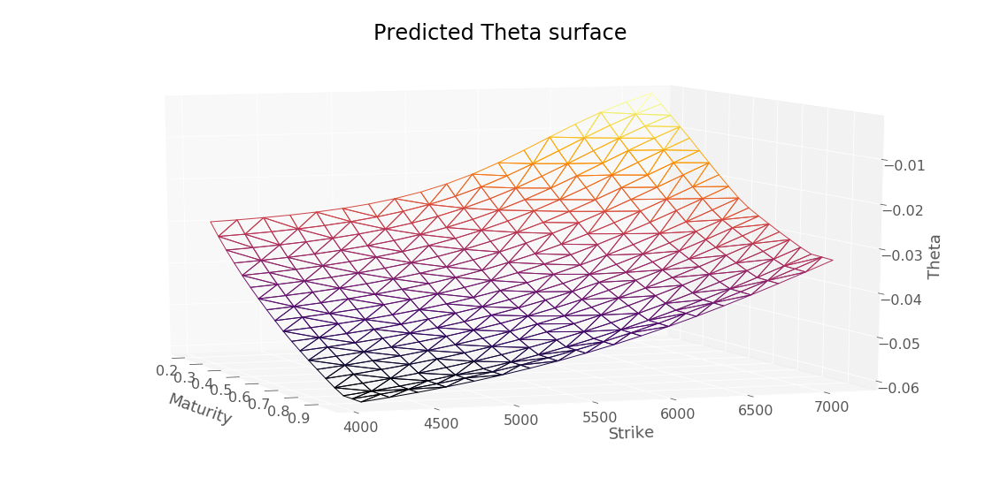

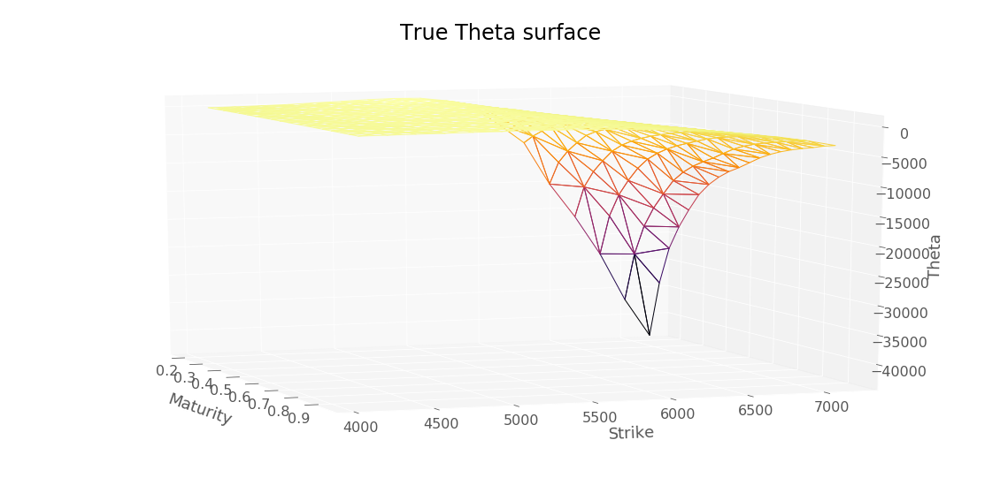

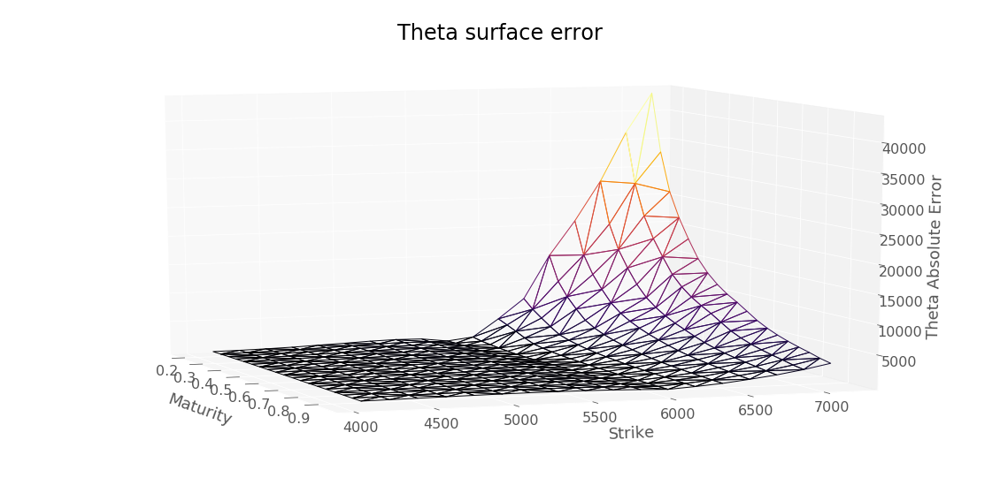

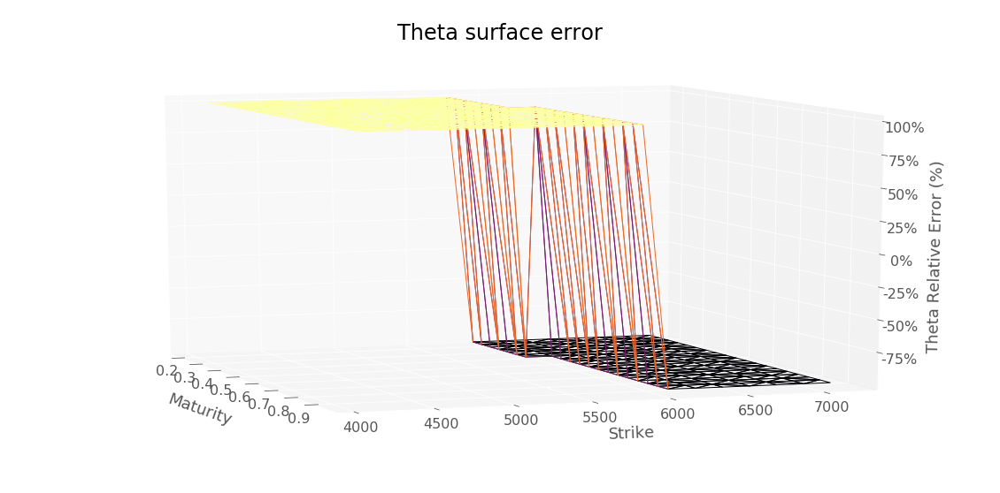

RMSE :  6330.123238070999


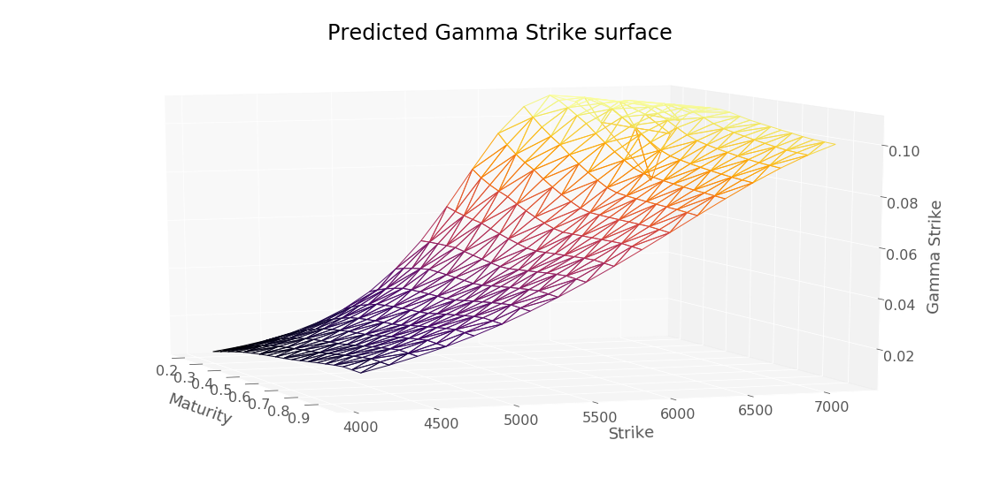

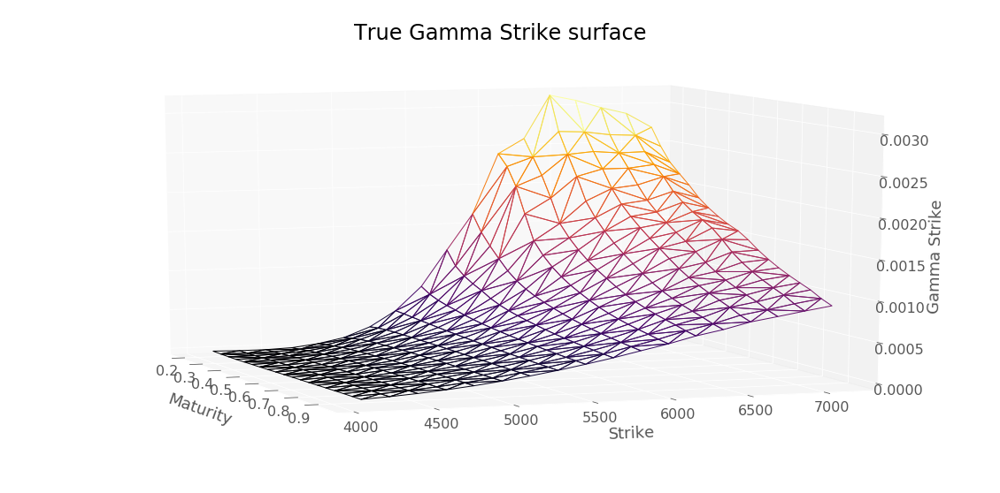

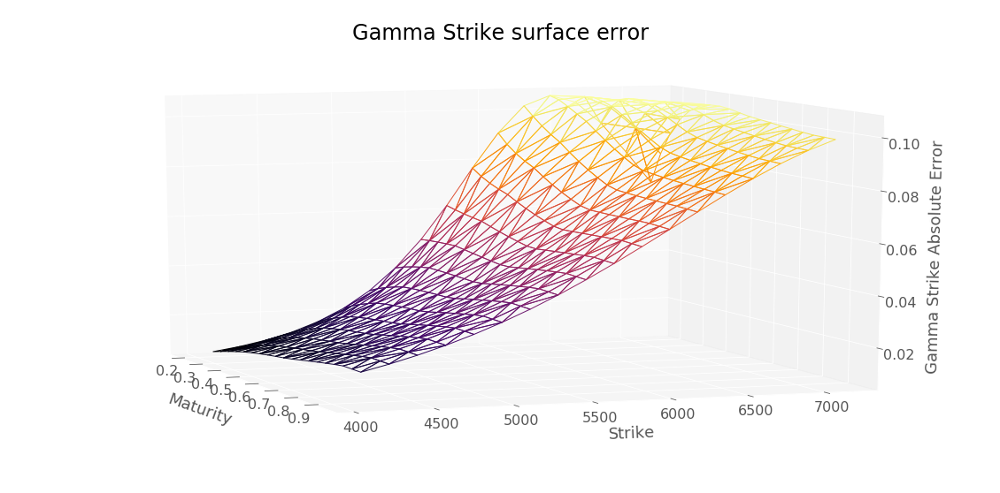

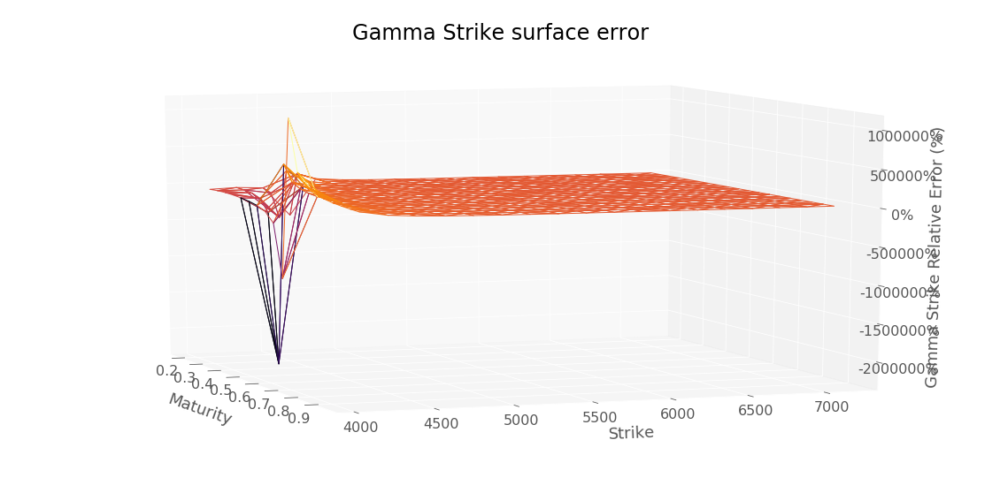

RMSE :  0.06387698490387207


In [ ]:
modelSummary(serie, 
             locVolSSVI, 
             dK, 
             hk, 
             dataSetTest, 
             yMin = -1000)

# On Aresky grid

In [ ]:
locVolAresky = pd.read_csv("./Final_results/Final_results/DAX_PUT_08082001/local_vol.csv",decimal=".").apply(pd.to_numeric)

In [ ]:
locVolAresky = locVolAresky.dropna()
locVolAresky["Strike"] = locVolAresky["K"].values
locVolAresky["Maturity"] = locVolAresky["T"].round(decimals=3)
renameDict = {"loc_vol" : "LocalVolatility"}
locVolAreskyFormatted = locVolAresky.rename(columns=renameDict).set_index(["Strike", "Maturity"])
locVolAreskyFormatted.head()

K         T  LocalVolatility
Strike      Maturity                                        
4211.394483 0.200     4211.394483  0.200000         0.308908
            0.232     4211.394483  0.231583         0.295924
            0.263     4211.394483  0.263167         0.289184
            0.295     4211.394483  0.294750         0.286390
            0.326     4211.394483  0.326333         0.284915

In [ ]:
locVolAreskyFormatted.shape

(1140, 3)

In [ ]:
changedVarAresky = changeOfVariable(locVolAreskyFormatted["K"],locVolAreskyFormatted["T"])
locVolAreskyFormatted["Maturity"] = locVolAreskyFormatted["T"]
locVolAreskyFormatted["Strike"] = locVolAreskyFormatted["K"]
locVolAreskyFormatted["ChangedStrike"] = pd.Series(changedVarAresky[0], index = locVolAreskyFormatted.index)
locVolAreskyFormatted["logMoneyness"] = np.log(locVolAreskyFormatted["ChangedStrike"] / S0[0])

In [ ]:
locVolAreskyFormatted = locVolAreskyFormatted[~locVolAreskyFormatted.index.duplicated(keep='first')]

In [ ]:
locVolAreskyFormatted.head()

K         T  LocalVolatility  Maturity  \
Strike      Maturity                                                     
4211.394483 0.200     4211.394483  0.200000         0.308908  0.200000   
            0.232     4211.394483  0.231583         0.295924  0.231583   
            0.263     4211.394483  0.263167         0.289184  0.263167   
            0.295     4211.394483  0.294750         0.286390  0.294750   
            0.326     4211.394483  0.326333         0.284915  0.326333   

                           Strike  ChangedStrike  logMoneyness  
Strike      Maturity                                            
4211.394483 0.200     4211.394483    4169.285347     -0.297610  
            0.232     4211.394483    4163.738588     -0.298941  
            0.263     4211.394483    4158.278179     -0.300253  
            0.295     4211.394483    4152.935748     -0.301539  
            0.326     4211.394483    4147.600095     -0.302824

In [ ]:
locVolAreskyFormatted.drop_duplicates().shape

(1135, 7)

In [ ]:
locVolAreskyFormatted.index.unique().shape

(1135,)

In [ ]:
dT, hk, dK, locVolSSVI, density = finiteDifferenceSVI(locVolAreskyFormatted, interpolateGrid)

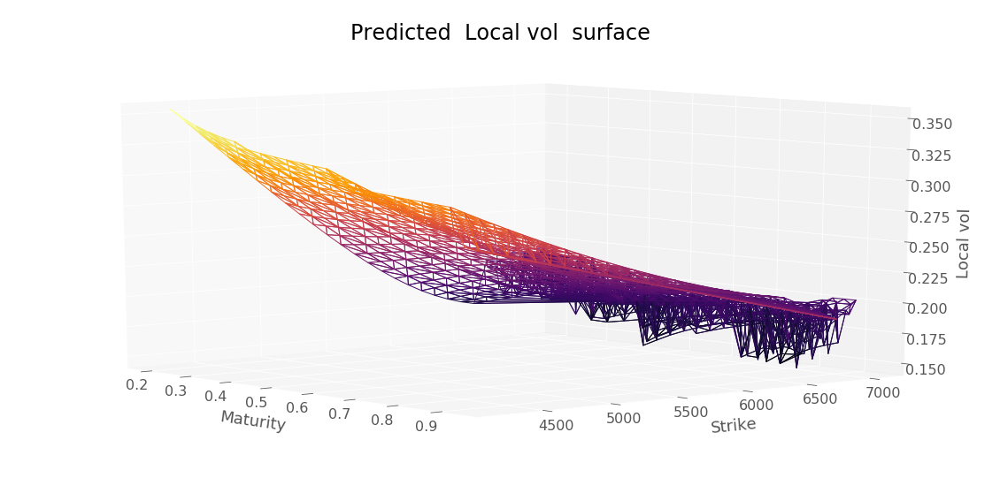

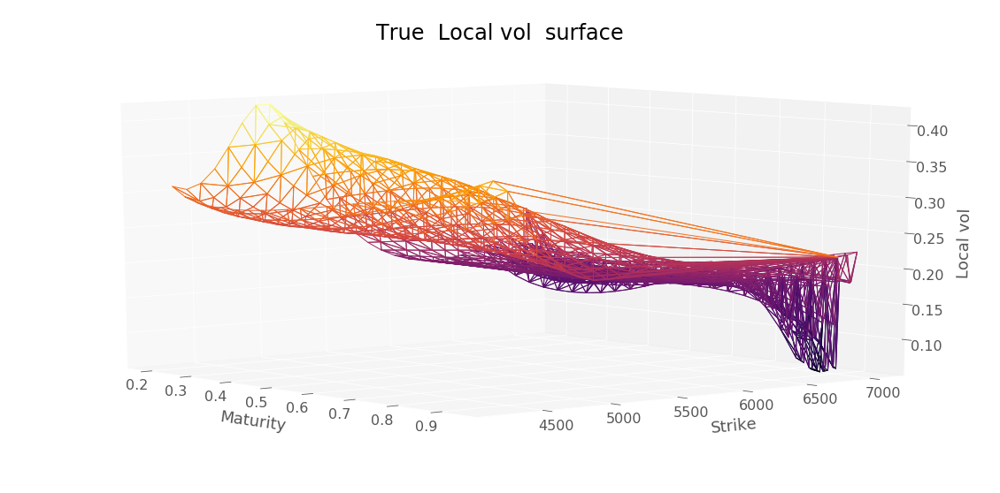

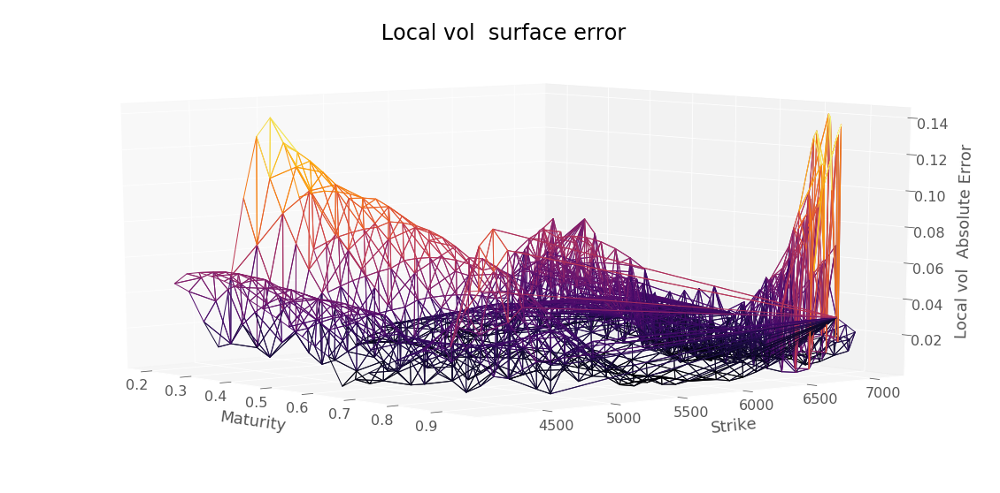

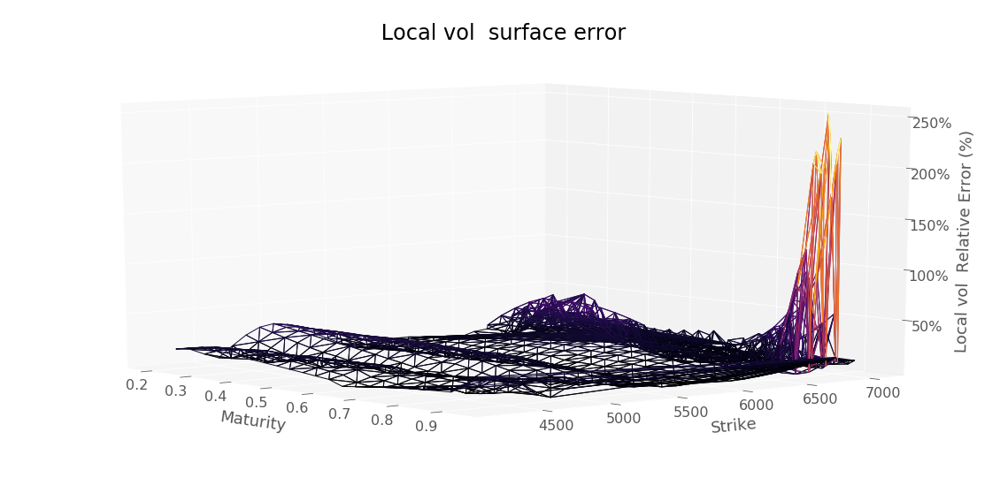

RMSE :  0.036157709071121584


In [ ]:
predictionDiagnosis(locVolSSVI, locVolAreskyFormatted["LocalVolatility"], " Local vol ", yMin=-1000)

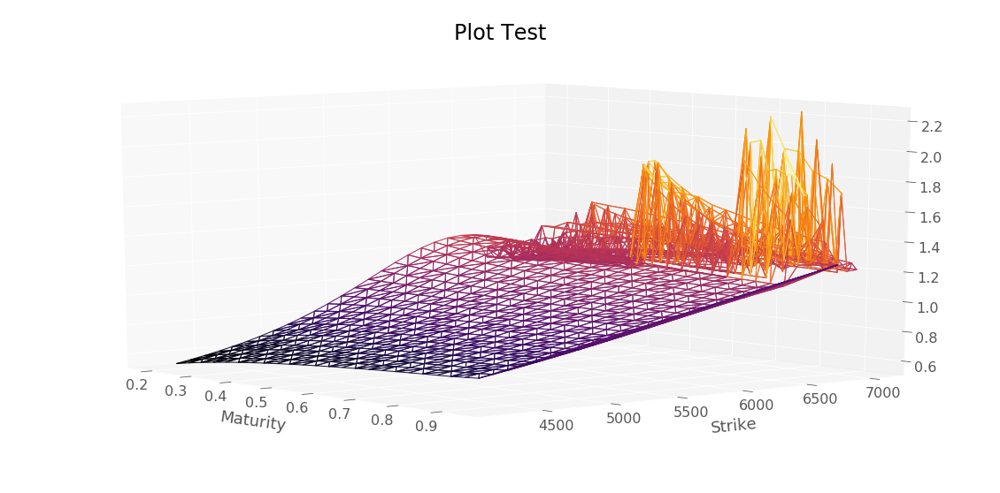

In [ ]:
plotSerie(density,
          Title = 'Plot Test',
          az=320,
          yMin=0,
          yMax=10000)

In [ ]:
locVolSSVIDf = locVolAreskyFormatted.copy(deep=True)
locVolSSVIDf["LocalVolatility"] = locVolSSVI

In [ ]:
locVolSSVIDf.tail()

K         T  LocalVolatility  Maturity  \
Strike      Maturity                                                     
7044.275385 0.832     7044.275385  0.831667         0.196127  0.831667   
            0.857     7044.275385  0.856933         0.196946  0.856933   
            0.882     7044.275385  0.882200         0.201923  0.882200   
            0.907     7044.275385  0.907467         0.202006  0.907467   
            0.933     7044.275385  0.932733         0.202035  0.932733   

                           Strike  ChangedStrike  logMoneyness  
Strike      Maturity                                            
7044.275385 0.832     7044.275385    6797.344318      0.191178  
            0.857     7044.275385    6790.256467      0.190134  
            0.882     7044.275385    6783.292897      0.189108  
            0.907     7044.275385    6776.431357      0.188096  
            0.933     7044.275385    6769.612223      0.187089

In [ ]:
dT[dT<0]

Series([], dtype: float64)

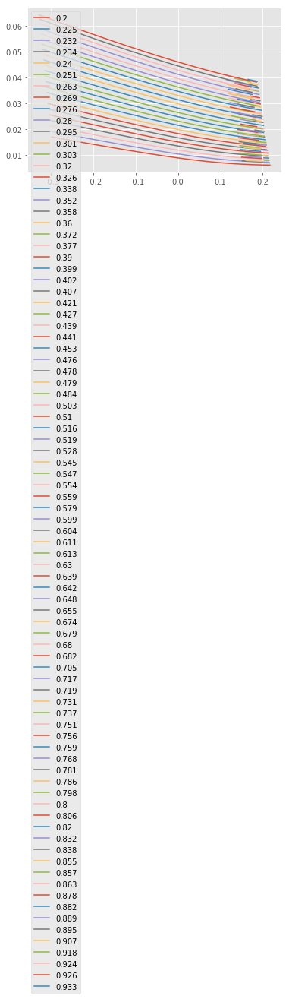

In [ ]:
plotEachSmilePred(locVolAreskyFormatted, interpolateGrid)
plt.show()

#### MC backtest Aresky

In [ ]:
def interpolatedMCLocalVolatility(localVol, strikes, maturities):
    coordinates =  np.array( customInterpolator(localVol, strikes, maturities) ).flatten()  
    return pd.Series(coordinates, index = pd.MultiIndex.from_arrays([strikes, maturities], names=('Strike', 'Maturity')))

In [ ]:
nbTimeStep = 100
nbPaths = 100000
def MonteCarloPricer(S, 
                     Strike, 
                     Maturity, 
                     rSpline, 
                     divSpline, 
                     nbPaths, 
                     nbTimeStep, 
                     volLocaleFunction):
  time_grid = np.linspace(0, Maturity, int(nbTimeStep + 1))
  timeStep = Maturity / nbTimeStep
  gaussianNoise = np.random.normal(scale = np.sqrt(timeStep), size=(nbTimeStep, nbPaths))

  logReturn = np.zeros((nbTimeStep + 1, nbPaths))
  logReturn[0,:] = 0

  for i in range(nbTimeStep) :
      t = time_grid[i]

      St = S0 * np.exp(logReturn[i,:])
      volLocale = volLocaleFunction(St, np.ones(nbPaths) * t)

      mu = rSpline(t) - divSpline(t)
      drift = np.ones(nbPaths) * (mu - np.square(volLocale) / 2.0) 
      logReturn[i + 1, :] = logReturn[i,:] + drift * timeStep + gaussianNoise[i,:] * volLocale
  SFinal = S0 * np.exp(logReturn[-1, :])
  return np.mean(np.maximum(Strike - SFinal, 0))

def MonteCarloPricerVectorized(S, 
                               dataSet,
                               rSpline, 
                               divSpline, 
                               nbPaths, 
                               nbTimeStep, 
                               volLocaleFunction):
  func = lambda x : MonteCarloPricer(S, x["Strike"], x["Maturity"], 
                                     riskCurvespline, divSpline, 
                                     nbPaths, nbTimeStep, 
                                     volLocaleFunction)
  return dataSet.apply(func, axis=1) * np.exp(-riskFreeIntegral(dataSet.index.get_level_values("Maturity")))

In [ ]:
testingDataSetAresky = interpolatedLocalVolatility(locVolAreskyFormatted, testingDataSet["Price"])

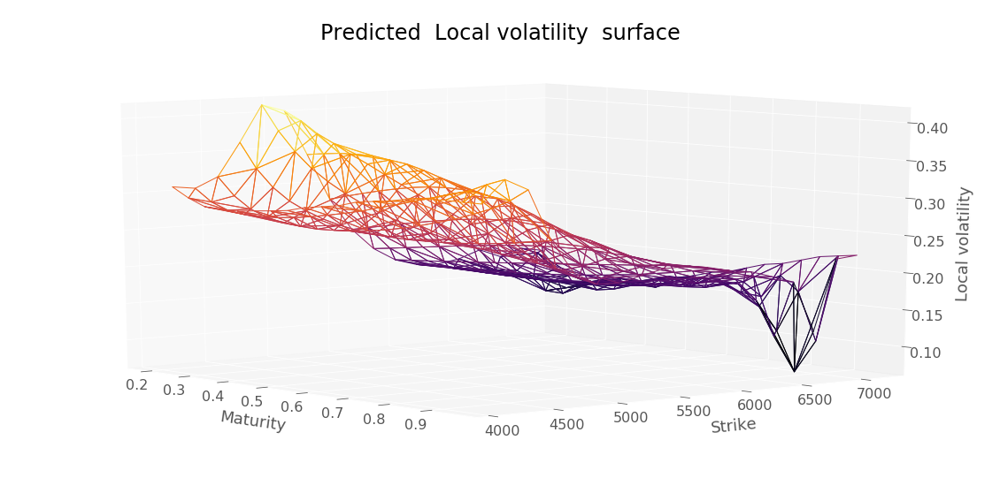

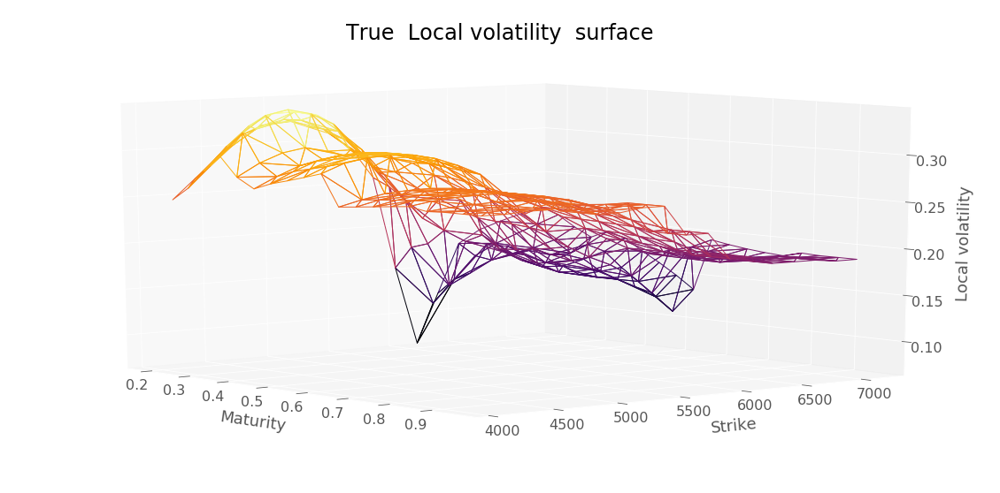

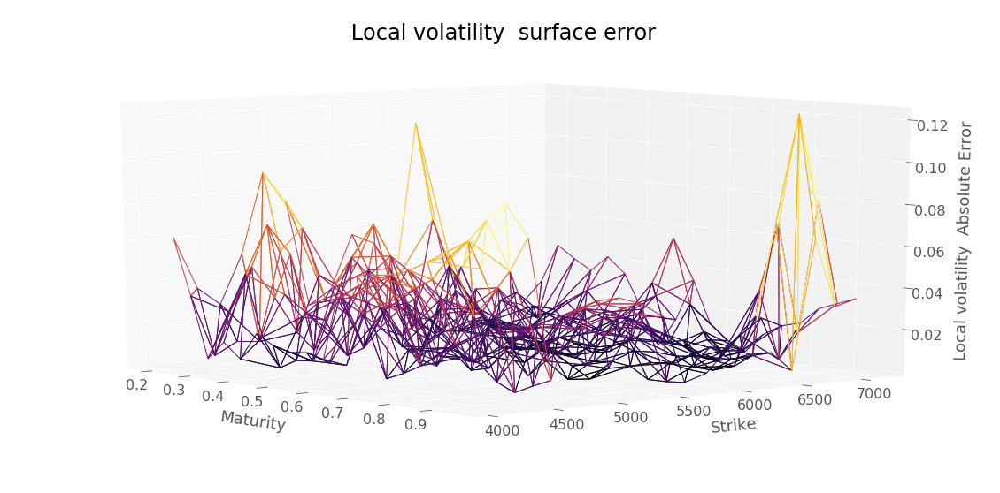

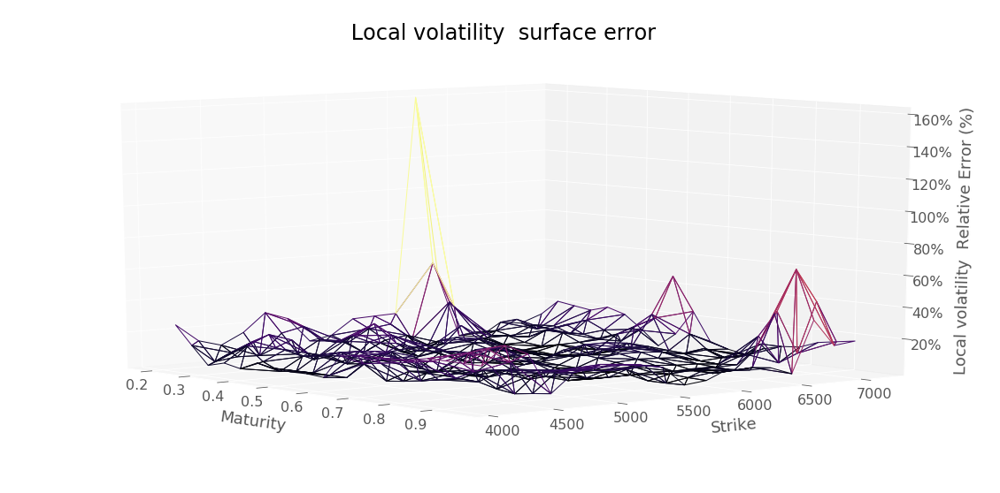

RMSE :  0.030946348990257458


In [ ]:
predictionDiagnosis(testingDataSetAresky, dataSetTest["locvol"], " Local volatility ")

In [ ]:
nnAresky = lambda x,y : interpolatedMCLocalVolatility(locVolAreskyFormatted["LocalVolatility"], x, y)

In [ ]:
mcResSigmaAresky = MonteCarloPricerVectorized(S0[0],
                                              dataSetTest,
                                              riskCurvespline,
                                              divSpline,
                                              nbPaths,
                                              nbTimeStep,
                                              nnAresky)
mcResSigmaAresky.head()

In [ ]:
predictionDiagnosis(mcResSigmaAresky, dataSetTest["Price"], " Price ", yMin=4100)

In [ ]:
mcResSigmaAresky.to_csv("mcResSigmaAresky.csv")

In [ ]:
plotSerie(testingDataSetAresky[testingDataSetAresky.index.get_level_values("Maturity") > 0.01],
          Title = 'Aresky Local Volatility Surface',
          az=30,
          yMin=0.0*S0,
          yMax=2.0*S0, 
          zAsPercent=True)

In [ ]:
def interpolatedMCLocalVolatility(localVol, strikes, maturities):
    coordinates =  np.array( customInterpolator(localVol, strikes, maturities) ).flatten()  
    return pd.Series(coordinates, index = pd.MultiIndex.from_arrays([strikes, maturities], names=('Strike', 'Maturity')))



In [ ]:
nnVolLocaleTykhonov = lambda x,y : interpolatedMCLocalVolatility(localVolatility["LocalVolatility"], x, y)


In [ ]:
s = testingDataSetAresky.index.get_level_values("Strike").values
t = testingDataSetAresky.index.get_level_values("Maturity").values

In [ ]:
tikhonovLocVol = nnVolLocaleTykhonov(s, t)
plotSerie(tikhonovLocVol[tikhonovLocVol.index.get_level_values("Maturity") > 0.01],
          Title = 'Tikhonov Local Volatility Surface',
          az=30,
          yMin=0.0*S0,
          yMax=2.0*S0, 
          zAsPercent=True)

In [ ]:
mcResTikhonov = MonteCarloPricerVectorized(S0[0],
                                           dataSetTest,
                                           riskCurvespline,
                                           divSpline,
                                           nbPaths,
                                           nbTimeStep,
                                           nnVolLocaleTykhonov)
mcResTikhonov.head()

In [ ]:
predictionDiagnosis(mcResTikhonov, dataSetTest["Price"], " Price ", yMin=4100)

#### Backtest Local SSVI 

In [ ]:
nnSSVI = lambda x,y : interpolatedMCLocalVolatility(locVolSSVIDf["LocalVolatility"], x, y)

In [ ]:
mcResSSVI = MonteCarloPricerVectorized(S0[0],
                                       dataSetTest,
                                       riskCurvespline,
                                       divSpline,
                                       nbPaths,
                                       nbTimeStep,
                                       nnSSVI)
mcResSSVI.head()

In [ ]:
predictionDiagnosis(mcResSSVI, dataSetTest["Price"], " Price ", yMin=4100)

In [ ]:
testingDataSetSSVI = interpolatedLocalVolatility(locVolSSVIDf, testingDataSet["Price"])

In [ ]:
plotSerie(testingDataSetSSVI[testingDataSetSSVI.index.get_level_values("Maturity") > 0.01],
          Title = 'SSVI Local Volatility Surface',
          az=30,
          yMin=0.0*S0,
          yMax=2.0*S0, 
          zAsPercent=True)